# Install libraries

In [ ]:
!pip install pytorch-pretrained-bert

In [ ]:
!pip install tensorflow-gpu==1.15

# Preprocessing Dataset
## Import dataset and analysis

In [ ]:
import pandas as pd
import numpy as np
import nltk
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from scipy.spatial.distance import squareform,pdist
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re
import gensim
import logging
from nltk.corpus import stopwords
import spacy
from spacy.lang.it.examples import sentences 
import spacy.cli
spacy.cli.download("it_core_news_sm")
import nltk
nltk.download('punkt')

✔ Download and installation successful
You can now load the model via spacy.load('it_core_news_sm')
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
df = pd.read_csv("cs4.csv",sep=",")

In [ ]:
print(df)
print("colonne:   ")
print(df.columns)
obiettivi = np.array(df["obiettivi"])

                                                titolo  ...                                        ambito
0                                        Inter-homines  ...                             Social distancing
1                              diAry - Digital Arianna  ...               Smart services and applications
2                                            CrownLabs  ...                             Distance Learning
3     ICLUS - Italian Covid-19 Lung Ultrasound project  ...                               Medical Imaging
4                                      TELEPSY-COVID19  ...        Servizi a supporto di problemi sociali
..                                                 ...  ...                                           ...
102  Myrror – Una Piattaforma di Holistic User Mode...  ...        Servizi a supporto di problemi sociali
103  Proposta di una soluzione di digital contact t...  ...                             Social distancing
104                      In Silico Trials for 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import sys

!test -d bert_repo || git clone https://github.com/google-research/bert bert_repo
if not 'bert_repo' in sys.path:
  sys.path += ['bert_repo']

# import python modules defined by BERT
import tokenization

In [ ]:
import torch
from pytorch_pretrained_bert import BertTokenizer, BertModel, BertForMaskedLM
import numpy as np
# OPTIONAL: if you want to have more information on what's happening, activate the logger as follows
import logging
#logging.basicConfig(level=logging.INFO)
  
# Load pre-trained model tokenizer (vocabulary)
#tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
tokenizer = tokenization.FullTokenizer("vocab.txt", do_lower_case=True)


In [ ]:
from spacy.lang.it.stop_words import STOP_WORDS
nlp = spacy.load("it_core_news_sm")
def clean_text(text, filtering=True):
    list_of_cleaning_signs = ['\x0c','\n']
    for sign in list_of_cleaning_signs:
        text = text.replace(sign, ' ')
    clean_text = re.sub('[^a-zA-Zòàùèéì]+',' ',text)
    clean_text.replace("\n",'')
    clean_text = clean_text.lower()
    doc = nlp(clean_text)
    text = ""
    for token in doc:
      if (token.pos_ == 'NOUN' or token.pos_ == 'VERB' or token.pos_ == ' ADJ') and len(token.text) > 2 and token.text not in STOP_WORDS:
        text = text+ " " + token.text
    if filtering:
      return text
    else:
      return clean_text

In [ ]:
final_list = [['persone',
  'soluzioni',
  'tracciamento',
  'soluzione',
  'scena',
  'museo',
  'distanza',
  'viene',
  'sicurezza',
  'risultato',
  'può',
  'ellissoidi',
  'approccio',
  'algoritmo',
  'accuratezza',
  'visitatori',
  'utilizzando',
  'tool',
  'stima',
  'sorveglianza',
  'solo',
  'smartphone',
  'secondo',
  'pronto',
  'play',
  'numero',
  'momento',
  'massa',
  'individuate',
  'flussi',
  'dp',
  'disponibile',
  'dinamica',
  'basa',
  'attualmente',
  'attesa',
  'area',
  'android',
  'accedere',
  'verranno',
  'tali',
  'successo',
  'store',
  'simili',
  'serie',
  'riguarda',
  'realizzazione',
  'rapidamente',
  'protezione',
  'prospettiva',
  'programma',
  'privacy',
  'presso',
  'omografia',
  'nuovo',
  'minuti',
  'migliore',
  'migliorare',
  'mappa',
  'letteratura',
  'interesse',
  'implementato',
  'grande',
  'google',
  'garantire',
  'figure',
  'dovrebbero',
  'distribuire',
  'direzione',
  'crittografici',
  'com',
  'ciascuna',
  'ble',
  'beacon',
  'basate',
  'attacchi',
  'antwerp',
  'anonimo',
  'altra',
  'accessi',
  'vorranno',
  'visualizzati',
  'vigenti',
  'view',
  'verificano',
  'validato',
  'va',
  'utilizzarle',
  'uffizi',
  'turisti',
  'trovano',
  'trasparenza',
  'trapezoidale',
  'tracing',
  'tipiche',
  'testata',
  'testarlo',
  'terrestre',
  'tentativi',
  'telemedicina',
  'telecamera',
  'takedistance',
  'successivamente',
  'stimata',
  'stakeholder',
  'spiccicati',
  'sperimentato',
  'specificità',
  'sovrappongono',
  'sostanzialmente',
  'sopra',
  'sfruttare',
  'sfruttando',
  'sensitività',
  'segnalazione',
  'scoperte',
  'scontrano',
  'sconfiggere',
  'scaricato',
  'sale',
  'rsa',
  'rosso',
  'riusciamo',
  'ritenute',
  'rispondano',
  'rispettive',
  'riscuotendo',
  'ripreso',
  'ripresa',
  'rimanere',
  'rettangolare',
  'reso',
  'resistenza',
  'resilienza',
  'regolati',
  'recente',
  'realizzate',
  'raccolto',
  'quantificabile',
  'pubblicata',
  'prospettica',
  'proporzione',
  'precisi',
  'precedenza',
  'pratica',
  'poter',
  'potenzialmente',
  'porzione',
  'piu',
  'pc',
  'pavis',
  'parlano',
  'parametrizzabile',
  'paradigma',
  'pan',
  'opensource',
  'oggetto',
  'offrendo',
  'normative',
  'nonché',
  'museali',
  'montare',
  'monitorata',
  'misurando',
  'minimizzare',
  'metro',
  'max',
  'matrice',
  'market',
  'manualmente',
  'magnetico',
  'isolate',
  'inviare',
  'intrinsecamente',
  'intraprendere',
  'interpersonali',
  'interna',
  'inter',
  'infette',
  'indice',
  'implementare',
  'immediatamente',
  'immagine',
  'iit',
  'id',
  'homines',
  'hash',
  'hardware',
  'gps',
  'governo',
  'governi',
  'gode',
  'giornate',
  'garantisce',
  'fuori',
  'facoltativamente',
  'estensione',
  'epidemiologi',
  'entrare',
  'elaborare',
  'efficienti',
  'efficacemente',
  'dritta',
  'distanziare',
  'distanze',
  'dispositivo',
  'disegnare',
  'discutiamo',
  'discutendo',
  'dimostrare',
  'differenza',
  'dettagliando',
  'details',
  'descritta',
  'densità',
  'decisamente',
  'decentramento',
  'decentralizzato',
  'decentralizzate',
  'davide',
  'costruisce',
  'corporee',
  'coordinate',
  'contrario',
  'contemporaneamente',
  'contact',
  'considerate',
  'confidenziale',
  'complete',
  'complessi',
  'committenti',
  'combinazione',
  'cm',
  'circolare',
  'cieche',
  'chiedere',
  'chiavi',
  'certificato',
  'cerchi',
  'centri',
  'centralizzato',
  'campus',
  'cambio',
  'calcolata',
  'calabria',
  'bluetooth',
  'bird',
  'attraente',
  'associare',
  'associano',
  'assembramenti',
  'aspettano',
  'articolazioni',
  'argomento',
  'archivi',
  'apps',
  'approssimativamente',
  'appble',
  'anversa',
  'andare',
  'ampio',
  'ambienti',
  'aggiunte',
  'aeroporto',
  'addetti',
  'act',
  'acquisiti',
  'accurata',
  'accettata',
  'accettabilità'],
 ['servizi',
  'gestione',
  'sims',
  'applicazione',
  'personale',
  'fragili',
  'supporto',
  'sociali',
  'sanitario',
  'livello',
  'servizio',
  'assistenza',
  'volontariato',
  'utenti',
  'sanitari',
  'progettata',
  'org',
  'operatori',
  'multi',
  'interessati',
  'implementazione',
  'fragile',
  'forma',
  'ecc',
  'dashboard',
  'corretta',
  'contagi',
  'assistenziali',
  'vicini',
  'vasari',
  'unificante',
  'ufficiali',
  'ufficiale',
  'tecnologica',
  'swaps',
  'superset',
  'siti',
  'riguardano',
  'reali',
  'pubblicate',
  'province',
  'proposta',
  'progettazione',
  'problematiche',
  'potrà',
  'ottenuto',
  'opere',
  'operatività',
  'ognuno',
  'offre',
  'necessario',
  'musei',
  'mostra',
  'modalità',
  'limitazioni',
  'inseriti',
  'innovativi',
  'includere',
  'funzionale',
  'etc',
  'esperienza',
  'digitale',
  'dettaglio',
  'automazione',
  'automatizzata',
  'attuale',
  'aperto',
  'apache',
  'alcun',
  'worth',
  'workflow',
  'vorremmo',
  'volta',
  'vogliano',
  'vocale',
  'visualizzazione',
  'visitate',
  'visita',
  'velocizzare',
  'valere',
  'utilizzatori',
  'utilizzano',
  'user',
  'usarli',
  'universitario',
  'unità',
  'unibg',
  'turista',
  'tumori',
  'trend',
  'tracciando',
  'toscane',
  'tempestività',
  'tecnologico',
  'tanto',
  'supportarne',
  'suggerimento',
  'strutturazione',
  'spinoff',
  'solitudine',
  'smartroadsense',
  'sintetiche',
  'singole',
  'sinergie',
  'significato',
  'sicura',
  'sembra',
  'selezionate',
  'segnale',
  'scambi',
  'scalabilita',
  'saragoza',
  'routinarie',
  'roads',
  'risultino',
  'riscontro',
  'riprova',
  'riporta',
  'riguardato',
  'rientro',
  'responsabili',
  'reperire',
  'regionale',
  'realizzata',
  'quartiere',
  'qualsiasi',
  'pseudonimizzazione',
  'provvisoria',
  'provincia',
  'prossimi',
  'propria',
  'progettati',
  'profilo',
  'produttiva',
  'process',
  'prevenendo',
  'prevedano',
  'potenziare',
  'potenziando',
  'portiere',
  'poco',
  'pluralità',
  'pesi',
  'pervasive',
  'pertanto',
  'perciò',
  'partita',
  'panorama',
  'pandemie',
  'ovvio',
  'ottenuta',
  'organi',
  'ordine',
  'orchestrazione',
  'operazioni',
  'operator',
  'operativi',
  'operante',
  'operano',
  'one',
  'oggi',
  'oggetti',
  'offerto',
  'novità',
  'necessarie',
  'nazione',
  'mykpi',
  'mvm',
  'museale',
  'moderna',
  'misto',
  'minute',
  'ministero',
  'migliaia',
  'microservizi',
  'membri',
  'medesime',
  'marketing',
  'mapping',
  'liberamente',
  'leva',
  'lanciate',
  'it',
  'istat',
  'iso',
  'iot',
  'iosonopersia',
  'interrogando',
  'interessato',
  'integrato',
  'integrativa',
  'integrandosi',
  'installato',
  'innovation',
  'iniziale',
  'infettivologiche',
  'inferiori',
  'indici',
  'incubator',
  'implicita',
  'http',
  'hoc',
  'guidare',
  'gestori',
  'garanzia',
  'garantendo',
  'gan',
  'front',
  'friendly',
  'frammentazione',
  'forze',
  'formata',
  'fonte',
  'fondanti',
  'fondamentali',
  'fog',
  'fisici',
  'filiera',
  'fast',
  'facilmente',
  'fabbricazione',
  'evidente',
  'eterogeneità',
  'esplicita',
  'esperto',
  'esigenze',
  'endpoint',
  'elevati',
  'dovute',
  'dotare',
  'distrettuali',
  'dispiegati',
  'disit',
  'direttamente',
  'digit',
  'diffuse',
  'devices',
  'detto',
  'destinatari',
  'destinata',
  'definito',
  'definitiva',
  'crowdsensing',
  'crm',
  'crescente',
  'covidfree',
  'contrastando',
  'contraddistingue',
  'contempo',
  'connesse',
  'condizione',
  'concreto',
  'comparto',
  'comparti',
  'comandi',
  'colleghi',
  'cittadina',
  'circoscrizione',
  'chart',
  'carichi',
  'carenza',
  'caratterizzanti',
  'capire',
  'canali',
  'call',
  'calcolato',
  'bubble',
  'bisogni',
  'bicocca',
  'beta',
  'benvenuto',
  'benefici',
  'based',
  'badante',
  'back',
  'avviato',
  'avviati',
  'avvalere',
  'aventi',
  'auspicate',
  'augmentation',
  'attivate',
  'attivare',
  'associata',
  'assistenziale',
  'assistente',
  'assicurare',
  'aspetti',
  'articola',
  'arricchire',
  'aqicn',
  'approcci',
  'apportare',
  'apparati',
  'apertura',
  'andamenti',
  'ampiamente',
  'amministratori',
  'amministrativi',
  'amministrative',
  'altervista',
  'allineate',
  'aggiungere',
  'affidabile',
  'adattabilita',
  'adattabile',
  'action',
  'acquisita',
  'accessibili',
  'accedervi'],
 ['collaborazione',
  'strumento',
  'strumenti',
  'piattaforma',
  'percorsi',
  'pandemia',
  'fonti',
  'creazione',
  'attraverso',
  'affidabili',
  'wwf',
  'verificate',
  'tour',
  'tipo',
  'territorio',
  'tempi',
  'tematici',
  'tematica',
  'tecnologie',
  'sviluppi',
  'supervisionata',
  'studenti',
  'sicure',
  'secondario',
  'scuole',
  'ribaltata',
  'realizzati',
  'psicologi',
  'processi',
  'primario',
  'prevede',
  'presenza',
  'prendere',
  'permetta',
  'pericoli',
  'partecipazione',
  'partecipanti',
  'palestra',
  'notizie',
  'naturali',
  'monitorare',
  'milanesi',
  'metriche',
  'learning',
  'lavorando',
  'laboratori',
  'introducendo',
  'interazioni',
  'ingegneria',
  'informatico',
  'informatica',
  'informare',
  'infodemia',
  'futuri',
  'fruizione',
  'fruibile',
  'fondate',
  'false',
  'evitare',
  'educatori',
  'educare',
  'edge',
  'docenti',
  'distance',
  'dinamiche',
  'didattici',
  'didattica',
  'culturali',
  'costruito',
  'costruire',
  'cooperazione',
  'contatto',
  'confutate',
  'condizioni',
  'computing',
  'collettivi',
  'cloud',
  'chatbot',
  'carattere',
  'beni',
  'artistici',
  'ampliare'],
 ['immagini',
  'fase',
  'diagnosi',
  'ct',
  'deep',
  'classificazione',
  'torace',
  'termini',
  'tac',
  'specifico',
  'senza',
  'polmonite',
  'polmonari',
  'polmonare',
  'mezzo',
  'iclus',
  'complicanza',
  'clinico',
  'clinici',
  'classificatori',
  'automatico',
  'acquisizione',
  'with',
  'utilizzati',
  'up',
  'supportare',
  'semantica',
  'seconda',
  'reti',
  'regioni',
  'ray',
  'radiografia',
  'precoci',
  'polmoniti',
  'pcr',
  'patologia',
  'ottenere',
  'neurali',
  'interstiziale',
  'imaging',
  'grangetto',
  'fasi',
  'evidenze',
  'estrazione',
  'esami',
  'contrasto',
  'configurata',
  'completo',
  'clinica',
  'automatici',
  'automaticamente',
  'apprendimento',
  'addestrata',
  'via',
  'velocità',
  'vedrà',
  'veda',
  'vasto',
  'validazione',
  'validarne',
  'utilizzate',
  'unveiling',
  'ultrasonografie',
  'truth',
  'tromboembolia',
  'trial',
  'trasferimento',
  'tissutali',
  'territoriale',
  'terapeutiche',
  'tep',
  'tempestivamente',
  'tartaglione',
  'tantomeno',
  'tangibile',
  'superiori',
  'superiore',
  'strutturato',
  'stabilire',
  'sostitutiva',
  'sostenuta',
  'sospetti',
  'soccorso',
  'small',
  'significative',
  'sfavorevole',
  'sezioni',
  'settaggi',
  'separazione',
  'senz',
  'sensibilità',
  'semiautomatica',
  'semi',
  'selezione',
  'segue',
  'segnala',
  'segmentazione',
  'scardapane',
  'scansioni',
  'sardegna',
  'sacco',
  'rt',
  'risultano',
  'risparmio',
  'ripetibile',
  'rilascio',
  'requisiti',
  'reperiti',
  'reparto',
  'rendere',
  'refertazione',
  'recrudescenza',
  'reclutare',
  'rappresenta',
  'randomforest',
  'radiomiche',
  'radiologie',
  'radiologia',
  'radiografico',
  'race',
  'provvederà',
  'proposizione',
  'progressione',
  'prognostiche',
  'prognostica',
  'professor',
  'probabilità',
  'priorità',
  'preventivo',
  'predittori',
  'precocità',
  'precauzionali',
  'post',
  'positività',
  'porzioni',
  'policlinico',
  'pdta',
  'parenchima',
  'pacchetto',
  'ottimali',
  'ottica',
  'opportunamente',
  'ondata',
  'né',
  'notevoli',
  'neosperience',
  'ncov',
  'morfologiche',
  'mette',
  'mesi',
  'medical',
  'medesimi',
  'marco',
  'lungo',
  'looptribe',
  'limitata',
  'letto',
  'lesioni',
  'iv',
  'irccs',
  'invece',
  'interventi',
  'interstiziali',
  'intero',
  'interi',
  'intere',
  'intelligenti',
  'iniziare',
  'iniziali',
  'informativo',
  'infettiva',
  'indicato',
  'inclusione',
  'iii',
  'hurdles',
  'ground',
  'gravità',
  'gravata',
  'gold',
  'futura',
  'from',
  'framework',
  'firme',
  'feature',
  'fbf',
  'favorevole',
  'facile',
  'eventualità',
  'esiti',
  'eseguibile',
  'esecuzione',
  'esclusione',
  'esame',
  'emergenziale',
  'embolia',
  'eleggibili',
  'eidoslab',
  'efficace',
  'ecografici',
  'ecografiche',
  'drug',
  'dose',
  'disponibilità',
  'discriminare',
  'diretto',
  'diminuire',
  'dimensione',
  'differenziale',
  'diagnostica',
  'determinata',
  'definisce',
  'definirsi',
  'decorso',
  'decisionali',
  'crs',
  'criteri',
  'costruzione',
  'corsie',
  'corrispondente',
  'convoluzionali',
  'convergono',
  'contiene',
  'consistente',
  'considerata',
  'confronto',
  'compagine',
  'classificatore',
  'classificare',
  'chest',
  'cdss',
  'casistiche',
  'casistica',
  'caratterizzazione',
  'caratterizzate',
  'campione',
  'calandri',
  'binaria',
  'bilanciata',
  'berzovini',
  'basati',
  'bari',
  'barbano',
  'auxologico',
  'automatica',
  'ausilio',
  'attuali',
  'asst',
  'appropriato',
  'approfondire',
  'appreso',
  'applicate',
  'appare',
  'almeno',
  'alimentata',
  'alcune',
  'alberi',
  'addestrare',
  'addestramento',
  'acquisito'],
 ['attività',
  'impatto',
  'stata',
  'sociale',
  'popolazione',
  'informazioni',
  'gruppi',
  'evoluzione',
  'diversi',
  'definire',
  'corso',
  'associazioni',
  'trovare',
  'situazione',
  'potrebbero',
  'locali',
  'individui',
  'famiglie',
  'estivi',
  'elevata',
  'domanda',
  'dipartimento',
  'comunità',
  'commerciali',
  'antropico',
  'altre',
  'utilizziamo',
  'urbana',
  'tutta',
  'sviluppato',
  'sviluppata',
  'struttura',
  'stress',
  'spaziale',
  'soprattutto',
  'semplici',
  'semplice',
  'seguenti',
  'scientifica',
  'sanitaria',
  'ruolo',
  'quasi',
  'quantità',
  'quantificare',
  'pubblici',
  'primo',
  'potrebbe',
  'possano',
  'periodi',
  'organizzazione',
  'numeri',
  'naturale',
  'luoghi',
  'lockdown',
  'iscritti',
  'internazionale',
  'interazione',
  'importante',
  'ii',
  'geografica',
  'genitori',
  'fattori',
  'faq',
  'esistenza',
  'economie',
  'eai',
  'disagio',
  'costi',
  'contribuire',
  'consentire',
  'concentrazione',
  'comuni',
  'censimento',
  'carico',
  'campi',
  'bambini',
  'avere',
  'archivio',
  'agglomerazione',
  'adulti',
  'adottate',
  'adattamento',
  'welfare',
  'volontario',
  'vivono',
  'visitati',
  'vision',
  'virtuali',
  'videochiamata',
  'vicinato',
  'viaggio',
  'viaggi',
  'verifica',
  'venezia',
  'variabilità',
  'vantaggi',
  'vale',
  'vacanze',
  'urbano',
  'universidade',
  'uniranno',
  'umana',
  'udd',
  'turni',
  'trento',
  'traffico',
  'topografia',
  'the',
  'th',
  'tendenze',
  'temporali',
  'telefoni',
  'telefonata',
  'telefonare',
  'telef',
  'teleconsulto',
  'telecomunicazioni',
  'tecnologici',
  'tecnicamente',
  'technologies',
  'tariffa',
  'svolte',
  'successiva',
  'subiscono',
  'studiati',
  'stipulano',
  'step',
  'statisticamente',
  'stagionalità',
  'spiagge',
  'specifici',
  'specifiche',
  'specializzate',
  'spazialità',
  'sottomesso',
  'sostenibile',
  'sostengono',
  'sola',
  'soggette',
  'soddisfazione',
  'socità',
  'sociologici',
  'sociatà',
  'smart',
  'sino',
  'simp',
  'settimane',
  'settimanali',
  'sentinel',
  'sensing',
  'sensibili',
  'semantico',
  'seguirà',
  'segnalare',
  'sedi',
  'secondarie',
  'scuola',
  'schools',
  'satellitari',
  'santiago',
  'santa',
  'sabato',
  'ruoli',
  'rotazione',
  'robotica',
  'rivolta',
  'rivelatrici',
  'riuscire',
  'risposte',
  'rispettano',
  'risoluzione',
  'rilevazione',
  'rilevamento',
  'rigenerazione',
  'riduzione',
  'ridotta',
  'ricostruzione',
  'ricostruire',
  'ricoprire',
  'response',
  'rendersi',
  'relativamente',
  'recentemente',
  'rapid',
  'raggiungimento',
  'raggio',
  'raccogliendo',
  'quei',
  'quarantene',
  'quantitativa',
  'quantificarne',
  'qualitativa',
  'pubblico',
  'psicoterapeuti',
  'psicoterapeuta',
  'psicosomatica',
  'proxy',
  'promozione',
  'promotore',
  'proceedings',
  'primary',
  'primaria',
  'pressioni',
  'presentata',
  'preparati',
  'prenotabili',
  'pregresse',
  'poteva',
  'potenziale',
  'posto',
  'posteriori',
  'postazioni',
  'posta',
  'portuali',
  'ponendo',
  'piedi',
  'personalizzati',
  'percorribili',
  'passo',
  'passati',
  'party',
  'partnership',
  'participact',
  'partecipato',
  'partecipativo',
  'parenti',
  'parchi',
  'paper',
  'pannello',
  'pagamento',
  'paese',
  'ovvero',
  'outdoor',
  'ospitano',
  'organizzati',
  'organizzare',
  'ordini',
  'openstreetmaps',
  'olci',
  'offrire',
  'offerta',
  'ocean',
  'objects',
  'notevole',
  'note',
  'nica',
  'news',
  'new',
  'municipalità',
  'motore',
  'miliardi',
  'metà',
  'mettendo',
  'metodo',
  'mensili',
  'megacities',
  'medie',
  'mcs',
  'massimo',
  'massima',
  'massiccia',
  'marino',
  'mai',
  'lutto',
  'localizzati',
  'località',
  'linee',
  'limitare',
  'italy',
  'istruzioni',
  'istituzionali',
  'iscrizione',
  'ipotizzando',
  'invio',
  'invernali',
  'intuitivo',
  'intitolato',
  'interpretare',
  'internet',
  'international',
  'interferire',
  'interessante',
  'intento',
  'integrano',
  'innescando',
  'iniziativa',
  'ingressi',
  'informato',
  'informale',
  'infocovid',
  'infettive',
  'industrie',
  'industriale',
  'individuale',
  'incontro',
  'incontri',
  'incontrate',
  'inclusivo',
  'inclini',
  'imposte',
  'importanza',
  'impegno',
  'hub',
  'how',
  'guida',
  'grave',
  'gratuiti',
  'granularità',
  'goodtechs',
  'good',
  'giocano',
  'geolocalizzate',
  'geografico',
  'generare',
  'generali',
  'frequenti',
  'forte',
  'fornitore',
  'formazioni',
  'for',
  'figli',
  'fiducia',
  'fedele',
  'fake',
  'exploration',
  'eventuale',
  'estive',
  'estado',
  'esistono',
  'effettuata',
  'education',
  'ecosistemi',
  'economico',
  'durate',
  'drammatico',
  'dovuti',
  'domestici',
  'domenica',
  'domande',
  'do',
  'diventando',
  'distretti',
  'dire',
  'dibattito',
  'desiderati',
  'desiderabilità',
  'desidera',
  'depressiva',
  'dense',
  'denominata',
  'debbano',
  'de',
  'date',
  'criticità',
  'crescere',
  'costringendo',
  'costiero',
  'correlata',
  'copertura',
  'cooperative',
  'conversazione',
  'conversazionali',
  'convenzioni',
  'contribuiranno',
  'contenere',
  'consideriamo',
  'considerati',
  'consenta',
  'conseguenza',
  'conseguente',
  'connettersi',
  'connessioni',
  'conferenza',
  'conference',
  'condominiali',
  'condividono',
  'conciliazione',
  'concessione',
  'concerti',
  'comunemente',
  'computer',
  'comportano',
  'componenti',
  'complessivi',
  'commerciabilità',
  'colour',
  'coloro',
  'coinvolgimento',
  'coinvolgere',
  'cocktail',
  'clusterizzati',
  'climatologiche',
  'climatiche',
  'classmate',
  'citylabs',
  'cittadinanza',
  'citarne',
  'cioè',
  'cina',
  'cileno',
  'cilena',
  'cile',
  'chile',
  'certificate',
  'cercare',
  'centinaia',
  'cellulari',
  'catena',
  'catarina',
  'caratterizzare',
  'brasile',
  'blocchi',
  'bisettimanale',
  'ben',
  'avvisi',
  'autorità',
  'autogestione',
  'assunto',
  'associazione',
  'assicurativa',
  'arpa',
  'apposito',
  'applichiamo',
  'apple',
  'antropiche',
  'antenna',
  'ansioso',
  'annuali',
  'annuale',
  'an',
  'ampliato',
  'amministrazioni',
  'alzare',
  'alert',
  'aiuto',
  'aggregati',
  'aggiornate',
  'affollamento',
  'affected',
  'adottata',
  'acquisire',
  'acquisendo',
  'accettato'],
 ['app',
  'sistema',
  'paziente',
  'of',
  'medici',
  'soggetti',
  'parametri',
  'favorire',
  'diabete',
  'cura',
  'cluster',
  'valutare',
  'valori',
  'srl',
  'respiro',
  'partner',
  'interagire',
  'generale',
  'diverse',
  'dedicato',
  'vita',
  'utente',
  'university',
  'telegram',
  'suggerire',
  'server',
  'remoto',
  'remissione',
  'reclutati',
  'possono',
  'possibili',
  'positivi',
  'ospedalieri',
  'ospedale',
  'mmg',
  'medico',
  'medicina',
  'medi',
  'malato',
  'frequenza',
  'facet',
  'europeo',
  'elaborati',
  'dunque',
  'domiciliare',
  'cronici',
  'crisi',
  'consentono',
  'completa',
  'coinvolti',
  'baseline',
  'zona',
  'vuole',
  'voce',
  'vitali',
  'videovisita',
  'vicinanza',
  'versano',
  'veicolo',
  'vb',
  'variazione',
  'urgenze',
  'tutt',
  'tralasciare',
  'tracciati',
  'touchless',
  'toccare',
  'testato',
  'tenere',
  'tempestivo',
  'telefono',
  'tele',
  'supervisionato',
  'suggestiva',
  'successive',
  'stile',
  'standardizzato',
  'stabilità',
  'spin',
  'spa',
  'sostituire',
  'sostegno',
  'somministrato',
  'sintomatologia',
  'sintomatici',
  'sintetizzandola',
  'sindrome',
  'sicuro',
  'sicurdata',
  'sesso',
  'serve',
  'sentire',
  'sensibile',
  'segni',
  'segnali',
  'scorso',
  'sangue',
  'salire',
  'rivela',
  'ritengano',
  'ricoverati',
  'richiedendo',
  'riabilitative',
  'riabilitativa',
  'respiratorio',
  'respiratorie',
  'residenti',
  'research',
  'reperibile',
  'registrazione',
  'registrate',
  'recupero',
  'recoveryaid',
  'razionale',
  'rappresentano',
  'raggiungere',
  'raccoglie',
  'questionario',
  'questionari',
  'quel',
  'pulsossimetro',
  'psicologico',
  'presa',
  'potranno',
  'posizionare',
  'pisana',
  'pilota',
  'piccolo',
  'piccoli',
  'piancavallo',
  'physiology',
  'permettera',
  'pericolo',
  'percepiti',
  'pediatrici',
  'patologie',
  'partizioni',
  'paradigmi',
  'ottimizzazione',
  'ottenendo',
  'ossigeno',
  'opuscolo',
  'opportuni',
  'opera',
  'omop',
  'off',
  'occuparsi',
  'occupare',
  'nuova',
  'nulla',
  'neuroscienze',
  'neonati',
  'national',
  'myhealth',
  'multidimensionale',
  'molinette',
  'misurare',
  'miglior',
  'messo',
  'mercato',
  'mellito',
  'medilogy',
  'mani',
  'malati',
  'libreria',
  'liberati',
  'legato',
  'leader',
  'lattanti',
  'lasciare',
  'kit',
  'ios',
  'intese',
  'integrata',
  'institute',
  'insiemi',
  'inseriscono',
  'innovativo',
  'iniziata',
  'ingeniars',
  'infermieri',
  'imminente',
  'illustrati',
  'identificato',
  'identificabile',
  'guidata',
  'gradimento',
  'gpi',
  'globale',
  'glicemie',
  'glicemico',
  'giornalieri',
  'gesti',
  'furti',
  'fumo',
  'fisioterapisti',
  'fisioterapista',
  'finalità',
  'fda',
  'familiari',
  'famiglia',
  'facoltativo',
  'facendoli',
  'evitando',
  'età',
  'esteso',
  'essi',
  'essenziali',
  'espresso',
  'esercizi',
  'eseguono',
  'epro',
  'enti',
  'engineering',
  'elaborazioni',
  'educativo',
  'dovuto',
  'dover',
  'dotazione',
  'dotati',
  'diverso',
  'distribuzione',
  'distinti',
  'dii',
  'diario',
  'diabetica',
  'deviazioni',
  'deterioramento',
  'detection',
  'destinato',
  'desiderate',
  'descritte',
  'department',
  'danneggiamenti',
  'curati',
  'cronico',
  'criterio',
  'council',
  'costituite',
  'costituita',
  'costantemente',
  'cosi',
  'corrispondono',
  'controllato',
  'continuità',
  'continuare',
  'consorzio',
  'consentirà',
  'congiunti',
  'congenita',
  'condivisione',
  'complessità',
  'compilazione',
  'collaborano',
  'coinvolgerà',
  'cogliere',
  'clinicamente',
  'clinical',
  'chat',
  'casa',
  'cardiopatia',
  'cardiaca',
  'capillare',
  'cammino',
  'breve',
  'avviata',
  'avvertire',
  'atto',
  'asintomatici',
  'armonizzare',
  'approved',
  'appropriatezza',
  'apparecchiatura',
  'anonimizzati',
  'anomaly',
  'anomalie',
  'analizzare',
  'altrettanto',
  'alimentare',
  'aircardio',
  'agevolare',
  'affetto',
  'affetti',
  'adesso',
  'accelerometro',
  'abitudini',
  'abilitarne'],
 ['modelli',
  'sito',
  'prodotti',
  'predittivi',
  'obiettivi',
  'esistenti',
  'creare',
  'vendi',
  'utilizzare',
  'tornare',
  'tenendo',
  'te',
  'successivo',
  'subito',
  'simulatori',
  'simil',
  'settore',
  'selezionati',
  'scontati',
  'scenari',
  'scegliere',
  'ritiro',
  'ritira',
  'ripartire',
  'ripartiamoinsieme',
  'riapertura',
  'puoi',
  'punti',
  'prodotto',
  'probabilmente',
  'principali',
  'prezzo',
  'posticipare',
  'pieno',
  'permettere',
  'orari',
  'opportunità',
  'ogni',
  'mobilità',
  'mese',
  'malattie',
  'malattia',
  'limiteranno',
  'intorno',
  'integrare',
  'insieme',
  'infrastruttura',
  'influenzali',
  'individuare',
  'incentivare',
  'incentiva',
  'giorni',
  'fornire',
  'finale',
  'fare',
  'esperti',
  'epidemie',
  'epidemia',
  'dopo',
  'decisioni',
  'danni',
  'contromisure',
  'conto',
  'contatti',
  'contagiosa',
  'consumi',
  'conoscenza',
  'concentreremo',
  'comprare',
  'clienti',
  'cliente',
  'bologna',
  'attrarre',
  'attenzione',
  'asporto',
  'altri',
  'alternativi',
  'acquisti',
  'acquistato'],
 ['relazioni',
  'dataset',
  'ricerca',
  'gene',
  'estratte',
  'scopo',
  'pubblicazioni',
  'proteine',
  'gruppo',
  'utilizzato',
  'sostanze',
  'risorsa',
  'riposizionamento',
  'ricerche',
  'ricercatori',
  'qualità',
  'navigazione',
  'menzioni',
  'meglio',
  'informatici',
  'geni',
  'farmaci',
  'facilitare',
  'entità',
  'disponibili',
  'cord',
  'chimiche',
  'biologi',
  'bioinformatics',
  'biocreative',
  'biobert',
  'volontari',
  'visione',
  'utili',
  'usato',
  'usati',
  'umani',
  'trentogrid',
  'tipi',
  'text',
  'termine',
  'terapie',
  'target',
  'svolto',
  'svolgere',
  'sviluppare',
  'sotto',
  'sfrutta',
  'scoperta',
  'scispacy',
  'scienziati',
  'scientifici',
  'scientifiche',
  'riunisce',
  'rilasciando',
  'riconosciute',
  'riconoscere',
  'relativo',
  'relative',
  'relation',
  'record',
  'rda',
  'python',
  'puri',
  'pubblicati',
  'provenienti',
  'progettando',
  'preprint',
  'preposto',
  'potenziali',
  'potenza',
  'poiché',
  'piattafoma',
  'penisola',
  'pagina',
  'ospite',
  'ospedali',
  'organizzazioni',
  'opportuna',
  'openaire',
  'ontology',
  'motivo',
  'molti',
  'mining',
  'metodologie',
  'mesh',
  'mers',
  'manuale',
  'lotta',
  'kaggle',
  'intervento',
  'internazionali',
  'interdisciplinare',
  'integrando',
  'infrastrutture',
  'indicatore',
  'importanti',
  'implementando',
  'identificheremo',
  'home',
  'guidato',
  'gateway',
  'futuro',
  'funzionalità',
  'fra',
  'fornendo',
  'europee',
  'etichetteremo',
  'estrarre',
  'esperimento',
  'espandere',
  'esistente',
  'emergenze',
  'elixir',
  'ecosistema',
  'dominio',
  'distribuito',
  'disease',
  'disciplinare',
  'dedicata',
  'costosa',
  'correntemente',
  'convogliare',
  'contenuti',
  'contenente',
  'conseguito',
  'concetto',
  'concetti',
  'comunicazione',
  'collegati',
  'collegarli',
  'collaborazioni',
  'codice',
  'citazioni',
  'chimici',
  'chemical',
  'cdr',
  'categorizzazione',
  'buona',
  'boinc',
  'bioinformatici',
  'attinenti',
  'articoli',
  'arte',
  'approssimazione',
  'appena',
  'appartenente',
  'annotazione',
  'analizzando',
  'alleanze',
  'aggregheremo',
  'aggregare',
  'addestrato',
  'accessibile'],
 ['dati',
  'analisi',
  'ulteriori',
  'traduzione',
  'spostamenti',
  'social',
  'network',
  'contagio',
  'città',
  'sorgenti',
  'resolution',
  'regionali',
  'reggio',
  'presente',
  'ordinanze',
  'negozi',
  'necessità',
  'nazionale',
  'modena',
  'integrazione',
  'integrati',
  'indicatori',
  'gratuita',
  'formato',
  'first',
  'estendere',
  'entity',
  'economiche',
  'differenti',
  'cliniche',
  'cleaning',
  'cartelle',
  'assessorato',
  'volontà',
  'vincoli',
  'verrà',
  'variazioni',
  'variant',
  'unito',
  'understandable',
  'ultime',
  'ultimato',
  'tratta',
  'tipologie',
  'time',
  'territoriali',
  'territori',
  'tener',
  'tempistiche',
  'telefoniche',
  'team',
  'tabui',
  'subiranno',
  'stimolare',
  'stessa',
  'spostamento',
  'sparql',
  'sparker',
  'socio',
  'simulazioni',
  'settori',
  'scaricabile',
  'scala',
  'riutilizzabile',
  'riguardanti',
  'restanti',
  'residente',
  'referenti',
  'reale',
  'readable',
  'rappresentata',
  'raccogliere',
  'query',
  'pubblicazione',
  'pubblica',
  'proposito',
  'prof',
  'processo',
  'probabili',
  'privati',
  'prese',
  'prescindere',
  'predire',
  'preceduta',
  'pratiche',
  'possibilita',
  'politiche',
  'point',
  'perdite',
  'partecipata',
  'ormai',
  'organismi',
  'offrono',
  'occorre',
  'necessariamente',
  'nazionali',
  'nata',
  'multidisciplinare',
  'molteplici',
  'modellare',
  'medesimo',
  'mappare',
  'love',
  'locale',
  'linked',
  'linguaggio',
  'interrogare',
  'interrogabile',
  'integrarli',
  'innovazione',
  'innovative',
  'iniziative',
  'influito',
  'influence',
  'industriali',
  'incrementare',
  'includono',
  'implementate',
  'guido',
  'github',
  'funzione',
  'frutto',
  'forniti',
  'formalmente',
  'firstlife',
  'finanziari',
  'fatturato',
  'europei',
  'esaminando',
  'domicilio',
  'diventata',
  'direttore',
  'dimensioni',
  'diffusion',
  'deve',
  'derivati',
  'deputati',
  'definizione',
  'dbgroup',
  'datariver',
  'database',
  'cotruita',
  'coordinato',
  'considerazione',
  'consegnano',
  'consegna',
  'confronti',
  'configurato',
  'compresi',
  'completamente',
  'commercio',
  'collaborative',
  'civile',
  'civico',
  'city',
  'cerved',
  'celle',
  'campania',
  'boella',
  'big',
  'avvale',
  'aver',
  'attivo',
  'applicare',
  'aperti',
  'anni',
  'analytics',
  'aderito',
  'accessibilità',
  'abbondante'],
 ['tramite',
  'vocali',
  'stato',
  'società',
  'situazioni',
  'rilevare',
  'relativi',
  'quarantena',
  'prima',
  'posti',
  'persona',
  'occupa',
  'necessitano',
  'monitoraggio',
  'blockchain',
  'assistita',
  'vocal',
  'vinto',
  'vincitrice',
  'velocemente',
  'use',
  'tutte',
  'tree',
  'tempestiva',
  'tematiche',
  'statistiche',
  'sperimentazione',
  'silver',
  'seed',
  'salute',
  'ricovero',
  'realizzato',
  'raggiunga',
  'proattivamente',
  'principalmente',
  'premi',
  'predittiva',
  'ospedalizzazione',
  'ora',
  'occorrenza',
  'numerosi',
  'mobile',
  'mediante',
  'maniera',
  'localizzare',
  'living',
  'intrusive',
  'interfacce',
  'intelligenza',
  'individuazione',
  'incubatore',
  'include',
  'impresa',
  'gestiti',
  'gestire',
  'forme',
  'finanziamenti',
  'filtrando',
  'evolvono',
  'eventualmente',
  'eventuali',
  'eventi',
  'ethereum',
  'essa',
  'es',
  'entro',
  'economy',
  'dot',
  'diventino',
  'distanziamento',
  'deepit',
  'daily',
  'critico',
  'critiche',
  'costante',
  'consente',
  'comune',
  'compatibili',
  'collabora',
  'cha',
  'certo',
  'case',
  'campo',
  'cadute',
  'benessere',
  'basata',
  'bando',
  'azienda',
  'attesi',
  'attento',
  'associate',
  'assistenti',
  'artificiale',
  'argomenti',
  'architettura',
  'applicativi',
  'anomali',
  'ambiente',
  'alto',
  'alcuni',
  'agevole',
  'activities',
  'accurato'],
 ['modello',
  'varianti',
  'stati',
  'rischio',
  'proteina',
  'sars',
  'cov',
  'controllo',
  'quindi',
  'infezione',
  'aree',
  'studio',
  'presenti',
  'misure',
  'identificazione',
  'diffusione',
  'base',
  'accesso',
  'partire',
  'nuovi',
  'nuove',
  'infezioni',
  'grafi',
  'dpi',
  'determinazione',
  'algoritmi',
  'strategie',
  'sequenziamento',
  'restrizioni',
  'percezione',
  'molecole',
  'mipup',
  'efficacia',
  'casi',
  'caratteristiche',
  'capacità',
  'calcolo',
  'bc',
  'basato',
  'anticorpo',
  'vista',
  'virali',
  'verificare',
  'trattamento',
  'trattamenti',
  'trasmissione',
  'terapeutico',
  'studi',
  'silico',
  'radiazioni',
  'principale',
  'possibilità',
  'mira',
  'laboratorio',
  'infine',
  'hosè',
  'fornisce',
  'filogenesi',
  'elaborazione',
  'controllare',
  'contrastare',
  'contenimento',
  'consentito',
  'computazionali',
  'computazionale',
  'ceppi',
  'caratterizzano',
  'binding',
  'applicato',
  'virale',
  'vengono',
  'vaccinazione',
  'umano',
  'tumore',
  'tipicamente',
  'telefonici',
  'superficie',
  'superfici',
  'supercalcolo',
  'suggerito',
  'spike',
  'sites',
  'simulazione',
  'simulatore',
  'sequenze',
  'scopi',
  'scalabile',
  'ridurre',
  'riconoscimento',
  'richiede',
  'retrieval',
  'relativa',
  'rappresentazione',
  'rapido',
  'radiologico',
  'quattro',
  'punta',
  'protein',
  'profilattico',
  'presentato',
  'precedente',
  'portando',
  'pocket',
  'pivot',
  'piemonte',
  'piccole',
  'organiche',
  'mostrato',
  'molecolari',
  'modellato',
  'migliori',
  'meccanismi',
  'malvirus',
  'lock',
  'ligando',
  'ligandi',
  'legami',
  'legame',
  'ipotesi',
  'infetti',
  'indicazioni',
  'grandi',
  'governative',
  'geo',
  'genomiche',
  'genomi',
  'formulazione',
  'fini',
  'exscalate',
  'epidemico',
  'elettrostatiche',
  'efficiente',
  'effetti',
  'down',
  'diretti',
  'considerando',
  'comprensione',
  'complesso',
  'clustering',
  'ciò',
  'chiamato',
  'ceppo',
  'carica',
  'campioni',
  'biochimici',
  'autorizzati',
  'approvati',
  'and',
  'agenti',
  'zone',
  'wang',
  'volumi',
  'vittime',
  'virtuale',
  'verso',
  'versione',
  'veloce',
  'valle',
  'vaccini',
  'urbane',
  'universitè',
  'ue',
  'trimerizzazione',
  'treeomics',
  'trasporto',
  'trascrizione',
  'transitano',
  'traccia',
  'topologici',
  'tempistica',
  'telefonia',
  'taluni',
  'tagging',
  'tabella',
  'svolgono',
  'sventati',
  'surface',
  'suggerite',
  'sufficiente',
  'subcloni',
  'studiato',
  'studiamo',
  'stratificazione',
  'storia',
  'statunitense',
  'spirito',
  'sperimentati',
  'sperati',
  'sondaggio',
  'somministrazione',
  'solvent',
  'soli',
  'socialità',
  'singolare',
  'simulati',
  'simpliciale',
  'similarità',
  'significativi',
  'shape',
  'ses',
  'sequencing',
  'separare',
  'scomporre',
  'scienze',
  'sanità',
  'rna',
  'rivelato',
  'rivelano',
  'rispettivamente',
  'risalente',
  'riprodurre',
  'rilevata',
  'rigoroso',
  'rifiuto',
  'rientrano',
  'riducendo',
  'ricostruzioni',
  'richiesti',
  'ricercatore',
  'ricadono',
  'restrizione',
  'rendimento',
  'renderlo',
  'rende',
  'regolatori',
  'registrati',
  'registrare',
  'reduce',
  'realtà',
  'raggiunge',
  'radiogenico',
  'radio',
  'racchiuso',
  'quaternaria',
  'pubblicamente',
  'prototipo',
  'protomeri',
  'proposto',
  'proponiamo',
  'propensione',
  'programmazione',
  'progettare',
  'profilattiche',
  'prevenire',
  'prevedere',
  'prescritti',
  'prendendo',
  'potenzialità',
  'potente',
  'popolato',
  'popolari',
  'platform',
  'picco',
  'piattaforme',
  'pesati',
  'perfeziona',
  'perfetta',
  'peculiarità',
  'patogeno',
  'patogeni',
  'pathway',
  'pathogens',
  'passi',
  'particolar',
  'pangenomica',
  'pangenomi',
  'ottimizzato',
  'ottimizzarne',
  'ottimale',
  'ostacolino',
  'ossia',
  'opinion',
  'operative',
  'omoplastiche',
  'object',
  'nucleo',
  'nodi',
  'neutralizzare',
  'networks',
  'nessuna',
  'mutazioni',
  'mutazionale',
  'movida',
  'monoclonale',
  'monitorati',
  'molte',
  'modulando',
  'modificano',
  'minori',
  'minima',
  'metrica',
  'messe',
  'memoria',
  'matematico',
  'massimizzare',
  'marcia',
  'map',
  'maggiormente',
  'lineare',
  'limitate',
  'limitatamente',
  'legarsi',
  'legali',
  'lavorano',
  'larga',
  'ipotizzati',
  'ionizzanti',
  'invarianti',
  'introdotti',
  'intrinseca',
  'intesa',
  'interne',
  'interfaccia',
  'intende',
  'intelligente',
  'installazione',
  'inserisce',
  'innanzitutto',
  'inibitori',
  'influenzata',
  'infettività',
  'infettato',
  'infettate',
  'infettano',
  'inferiore',
  'indossati',
  'indossa',
  'individuati',
  'indirizzate',
  'incluso',
  'includa',
  'implica',
  'implementiamo',
  'impedito',
  'impedire',
  'immediato',
  'idrofobicità',
  'idee',
  'idea',
  'hinterland',
  'hijacking',
  'gustave',
  'guidano',
  'gravi',
  'granger',
  'grafica',
  'gradualmente',
  'governativa',
  'glicoproteina',
  'gisaid',
  'getta',
  'geometrica',
  'geometria',
  'genovese',
  'genomica',
  'genoma',
  'genetiche',
  'generalmente',
  'future',
  'fronte',
  'francia',
  'foursquare',
  'forza',
  'formare',
  'food',
  'fenotipici',
  'fedeli',
  'farmaceutici',
  'far',
  'fa',
  'excluded',
  'exascale',
  'evolutiva',
  'evidenziato',
  'evidenziano',
  'evidenzia',
  'evento',
  'et',
  'esterni',
  'esposto',
  'esigenza',
  'esatto',
  'esaminati',
  'equipaggiato',
  'epidemiology',
  'epidemiologico',
  'epidemici',
  'epicov',
  'entpe',
  'eliminazione',
  'elettrostatico',
  'elettromagnetico',
  'eiffel',
  'effettivo',
  'eccessiva',
  'dosimetro',
  'dosaggio',
  'dompé',
  'dna',
  'diversità',
  'divario',
  'distribuite',
  'disporre',
  'dispiegato',
  'dispiegamento',
  'discendente',
  'dimostrate',
  'determinare',
  'definite',
  'decisore',
  'critici',
  'convalidati',
  'controllate',
  'contests',
  'contenuto',
  'contaminazione',
  'contagiate',
  'considerato',
  'conosciute',
  'conformità',
  'concentrati',
  'computational',
  'comprese',
  'complessiva',
  'complesse',
  'comparative',
  'communications',
  'combinazioni',
  'colmare',
  'collegandolo',
  'co',
  'clonale',
  'classi',
  'citup',
  'citochine',
  'ciascun',
  'chiusura',
  'chimico',
  'chiave',
  'chiaramente',
  'centrality',
  'cellula',
  'causality',
  'catalogo',
  'capside',
  'capace',
  'candidati',
  'brescia',
  'biophysical',
  'biologiche',
  'biologica',
  'biochemical',
  'betweennes',
  'bergamo',
  'benchmark',
  'azione',
  'avanti',
  'autorizzato',
  'aumentato',
  'aumentare',
  'attuate',
  'attuata',
  'atti',
  'atomici',
  'atomi',
  'assorbita',
  'associando',
  'asintomatiche',
  'asintomatica',
  'arrivo',
  'apre',
  'approssimata',
  'approfondirne',
  'applicazioni',
  'applicata',
  'applicando',
  'antivirali',
  'anticipato',
  'antenato',
  'antecedenti',
  'annualmente',
  'anno',
  'animali',
  'andamento',
  'ancestree',
  'analoghi',
  'analizziamo',
  'analizzati',
  'analizzata',
  'amplicon',
  'amministrare',
  'alfa',
  'aggressioni',
  'agent',
  'against',
  'administration',
  'adeguati',
  'adeguata',
  'adatto',
  'adattare',
  'acquisite',
  'accoppiandole',
  'access',
  'acceda',
  'abbattendo'],
 ['temperatura',
  'termico',
  'software',
  'interno',
  'volti',
  'viso',
  'termocamere',
  'spazio',
  'previsti',
  'occhio',
  'monitoring',
  'misurazione',
  'misura',
  'durante',
  'determinato',
  'detector',
  'corporea',
  'chiuso',
  'canto',
  'volto',
  'video',
  'vendita',
  'vari',
  'vanno',
  'utilizzata',
  'usare',
  'ultimo',
  'termoscanner',
  'termometriche',
  'termiche',
  'temporale',
  'telecamere',
  'tecnologia',
  'superamento',
  'suggeriscono',
  'spurie',
  'sportive',
  'spettro',
  'spazi',
  'space',
  'soglia',
  'soggetto',
  'scostamento',
  'scientifico',
  'saturation',
  'risulta',
  'ristoranti',
  'riscaldamento',
  'ripresi',
  'rileva',
  'riferimento',
  'respirazione',
  'radiometriche',
  'radiometricamente',
  'quest',
  'punto',
  'proximity',
  'prototipale',
  'proprietà',
  'proiezione',
  'produzione',
  'produttori',
  'processare',
  'processamento',
  'precedentemente',
  'posizione',
  'portare',
  'poi',
  'pipeline',
  'people',
  'occlusioni',
  'occhiali',
  'notifiche',
  'nota',
  'necessaria',
  'misurazioni',
  'mediata',
  'mascherina',
  'mantenimento',
  'manifestazioni',
  'luce',
  'localizzazione',
  'letture',
  'legge',
  'italiano',
  'istituto',
  'inviato',
  'inquadratura',
  'input',
  'ininterrottamente',
  'indossi',
  'individua',
  'impostati',
  'impiego',
  'identifica',
  'icpr',
  'health',
  'gpu',
  'funzioni',
  'funziona',
  'frontale',
  'frame',
  'fotocamera',
  'fondazione',
  'flows',
  'finora',
  'figura',
  'erronee',
  'durata',
  'distancing',
  'dipendenti',
  'devono',
  'dato',
  'counting',
  'correzione',
  'corretto',
  'corpo',
  'contributo',
  'concordati',
  'comprende',
  'completamento',
  'collaborativo',
  'circostante',
  'causa',
  'calibrate',
  'behavior',
  'bar',
  'aziende',
  'auto',
  'attuazione',
  'attivano',
  'attiva',
  'articolo',
  'applicabile',
  'annotazioni',
  'ambiti',
  'allarme',
  'aggiuntive',
  'accedono'],
 ['test',
  'web',
  'oltre',
  'grado',
  'sviluppo',
  'rete',
  'parte',
  'utilizzo',
  'testing',
  'fine',
  'così',
  'continuo',
  'set',
  'score',
  'raggi',
  'punteggio',
  'protocollo',
  'miglioramento',
  'inoltre',
  'brixia',
  'visivo',
  'unico',
  'ulteriormente',
  'troppo',
  'sviluppati',
  'superare',
  'strutture',
  'sovraccarico',
  'sopravvivenza',
  'solidità',
  'sintomi',
  'sin',
  'screening',
  'sanitarie',
  'riteniamo',
  'realmente',
  'rapporto',
  'radiologi',
  'protocolli',
  'pronta',
  'produrre',
  'primi',
  'previsioni',
  'predittivo',
  'possa',
  'polmoni',
  'net',
  'molecolare',
  'mappe',
  'macchina',
  'infiammazione',
  'impegnativo',
  'identificate',
  'identificare',
  'ia',
  'giorno',
  'falsi',
  'equo',
  'end',
  'ematochimici',
  'elevate',
  'efficaci',
  'effettuare',
  'economica',
  'contesti',
  'comportamento',
  'compito',
  'coerenza',
  'bs',
  'bassa',
  'atteso',
  'appositamente',
  'applicabili',
  'weakly',
  'volontaria',
  'visto',
  'variegato',
  'variabili',
  'valutato',
  'utilizzabili',
  'utilità',
  'uscita',
  'usabilità',
  'uomo',
  'unibs',
  'tuttavia',
  'tutela',
  'tuning',
  'trasformando',
  'traiettorie',
  'to',
  'testati',
  'tecnico',
  'supportando',
  'supervisionati',
  'supervised',
  'super',
  'suggerisce',
  'suggerimenti',
  'suddette',
  'strutturata',
  'strettamente',
  'strategia',
  'stime',
  'stabilito',
  'spiegabilità',
  'specializzazione',
  'specializzati',
  'solido',
  'smi',
  'singoli',
  'sierologici',
  'sfruttato',
  'sfera',
  'severità',
  'seno',
  'sempre',
  'sebbene',
  'scenario',
  'scarsità',
  'scansione',
  'rx',
  'rrt',
  'robustezza',
  'risultata',
  'risposta',
  'risolvere',
  'risolute',
  'rimosso',
  'rilevati',
  'riacutizzarsi',
  'ri',
  'report',
  'realizzare',
  'realisticamente',
  'rapida',
  'radiomica',
  'radiografie',
  'raccolte',
  'qualora',
  'qualificato',
  'provinciali',
  'prototipi',
  'propri',
  'proponenti',
  'promettente',
  'progressivo',
  'progressivamente',
  'prognosi',
  'progettato',
  'produttive',
  'privata',
  'primarie',
  'previsto',
  'previste',
  'previsione',
  'prevenzione',
  'prevalenza',
  'predizioni',
  'predizione',
  'predittive',
  'precedenti',
  'portata',
  'portabilità',
  'popolazioni',
  'ponte',
  'poichè',
  'poche',
  'plots',
  'pixel',
  'piuttosto',
  'persiste',
  'permettono',
  'permesso',
  'pensata',
  'patterns',
  'panel',
  'pandemico',
  'output',
  'ottime',
  'ottima',
  'ottavo',
  'osservando',
  'ospedaliere',
  'originale',
  'operatore',
  'offerte',
  'occasione',
  'nessun',
  'nero',
  'negativi',
  'modificate',
  'misurata',
  'metodologico',
  'metodologia',
  'metodiche',
  'meccanismo',
  'massivo',
  'manifatturiere',
  'manichini',
  'mancano',
  'lunghi',
  'linea',
  'lgs',
  'lavoratori',
  'italiane',
  'ipotizzare',
  'iper',
  'invade',
  'inteso',
  'interpretati',
  'interessare',
  'interamente',
  'insorgere',
  'inserite',
  'inserire',
  'inserimento',
  'ingresso',
  'inferenze',
  'industria',
  'indirizzato',
  'incoraggiano',
  'identificano',
  'group',
  'gran',
  'giornalmente',
  'geografiche',
  'geograficamente',
  'geografia',
  'generate',
  'generalizzazione',
  'fornite',
  'features',
  'fattibilità',
  'evidenziando',
  'estratti',
  'esterna',
  'estensivi',
  'esso',
  'essenzialmente',
  'esportazioni',
  'esito',
  'esiste',
  'eseguito',
  'errori',
  'elevato',
  'efficienza',
  'effettuato',
  'dpcm',
  'diversa',
  'diventerà',
  'diventati',
  'distribuiti',
  'distinguere',
  'disagiate',
  'diretta',
  'dimostrato',
  'dimostra',
  'diagnostico',
  'diagnostici',
  'descrittivo',
  'demografici',
  'deduce',
  'decessi',
  'decedute',
  'datasets',
  'cxr',
  'creato',
  'crea',
  'correttezza',
  'correttamente',
  'correlazione',
  'correlati',
  'contratto',
  'contestualmente',
  'contengono',
  'considerevole',
  'considerare',
  'confrontato',
  'concordanza',
  'concepita',
  'concentrate',
  'comprensivi',
  'comprendere',
  'compiti',
  'competenti',
  'competente',
  'comorbidità',
  'collaborativi',
  'coinvolto',
  'coinvolge',
  'cifre',
  'cieco',
  'certezza',
  'cercherà',
  'cercando',
  'causali',
  'categoria',
  'cartella',
  'calcolatore',
  'buone',
  'bresciano',
  'bisogno',
  'benchè',
  'basso',
  'avviso',
  'avviene',
  'avviare',
  'autonoma',
  'autofinanziata',
  'aumentata',
  'aumentano',
  'assistito',
  'aspettiamo',
  'aspetta',
  'appartiene',
  'anticipando',
  'alternativo',
  'altamente',
  'allocazione',
  'allineamento',
  'algoritmico',
  'affrontare',
  'affidabilità',
  'adozione',
  'adottato',
  'adesioni',
  'adesione',
  'addestrati',
  'addestrando',
  'adattati',
  'adattata',
  'accurate'],
 ['academy',
  'digital',
  'aica',
  'volte',
  'tempo',
  'ritardo',
  'rispetto',
  'professionale',
  'particolare',
  'modo',
  'italia',
  'formazione',
  'digitali',
  'contesto',
  'competenze',
  'aggiuntivo',
  'valore',
  'trascurabile',
  'svolge',
  'sviluppa',
  'stesso',
  'standard',
  'singolo',
  'sera',
  'scolastico',
  'rivolge',
  'rilevante',
  'riferibili',
  'regione',
  'quando',
  'proprio',
  'propone',
  'professioni',
  'prefigge',
  'pre',
  'pianifica',
  'periodo',
  'perdita',
  'percorso',
  'pattern',
  'paesi',
  'pacchetti',
  'osservato',
  'osservati',
  'orientamento',
  'operare',
  'on',
  'mostrano',
  'mondo',
  'minore',
  'minimo',
  'metta',
  'medio',
  'maggiori',
  'maggiore',
  'maggior',
  'livelli',
  'libero',
  'latenza',
  'jitter',
  'intera',
  'indica',
  'europa',
  'educazione',
  'deviazione',
  'contribuiscono',
  'consulente',
  'consapevolezza',
  'cittadini',
  'circa',
  'certificazione',
  'centro',
  'cambiamenti',
  'blocco',
  'aumento',
  'attori',
  'agile',
  'adeguato'],
 ['risultati',
  'risorse',
  'mlia',
  'messaggi',
  'corpus',
  'affermazioni',
  'veridicità',
  'valutazione',
  'twitter',
  'tecniche',
  'studiare',
  'sistemi',
  'lingua',
  'focalizzato',
  'data',
  'worker',
  'wita',
  'ulteriore',
  'tre',
  'task',
  'spesso',
  'sperimentali',
  'specialistica',
  'raccolti',
  'raccolta',
  'natura',
  'milioni',
  'metadati',
  'machine',
  'linguistiche',
  'informazione',
  'information',
  'giudicare',
  'fenomeni',
  'extraction',
  'consiste',
  'collezioni',
  'ambito',
  'workers',
  'vocabolari',
  'vario',
  'varie',
  'valerio',
  'ultilingual',
  'twita',
  'translation',
  'totale',
  'tommaso',
  'testo',
  'sviluppate',
  'sperimentare',
  'specificatamente',
  'source',
  'semantiche',
  'semantic',
  'search',
  'scelte',
  'scale',
  'riuso',
  'richiesto',
  'restituita',
  'reperimento',
  'recenti',
  'ragione',
  'quotidianamente',
  'pubbliche',
  'problema',
  'precisione',
  'picchi',
  'personali',
  'passato',
  'opportune',
  'opinioni',
  'open',
  'nomi',
  'multilingua',
  'mostrare',
  'mila',
  'mettere',
  'metodi',
  'mediche',
  'media',
  'lista',
  'link',
  'linguistica',
  'lingue',
  'licenze',
  'legate',
  'keyword',
  'iterativo',
  'italiani',
  'italiana',
  'informative',
  'indicativa',
  'incrementale',
  'groningen',
  'gia',
  'geolocalizzazione',
  'generica',
  'focalizzate',
  'focalizzano',
  'filtrati',
  'fenomeno',
  'favorirne',
  'fatto',
  'evidenza',
  'epidemiologici',
  'effetto',
  'effettivi',
  'documenti',
  'disposizione',
  'discorso',
  'delicate',
  'dedicarsi',
  'crowdsourcing',
  'crowd',
  'creative',
  'corpora',
  'conseguimento',
  'conoscenze',
  'confrontare',
  'condivisa',
  'condividere',
  'concrete',
  'concernenti',
  'comunita',
  'complicazione',
  'completare',
  'commons',
  'collezione',
  'collegamento',
  'citati',
  'cicli',
  'ciascuno',
  'chiediamo',
  'catturare',
  'caselli',
  'buoni',
  'basile',
  'basi',
  'basandosi',
  'background',
  'azioni',
  'applicati',
  'api',
  'analysis',
  'alta',
  'aggregazione',
  'aggiunta',
  'affronta',
  'adotta',
  'accuratamente',
  'accordo'],
 ['maschera',
  'maschere',
  'emergenza',
  'unipd',
  'terapia',
  'stampa',
  'mask',
  'lato',
  'dispositivi',
  'altro',
  'voluto',
  'universita',
  'snorkeling',
  'prestazioni',
  'permette',
  'pap',
  'padova',
  'ottenuti',
  'intensiva',
  'disponibilita',
  'convertite',
  'convertita',
  'conversione',
  'connettori',
  'connettore',
  'caso',
  'aria',
  'alternativa',
  'volume',
  'valvola',
  'utilizzabile',
  'utilizza',
  'utile',
  'usando',
  'tradizionali',
  'testate',
  'testare',
  'tenuta',
  'tecnica',
  'supplire',
  'sub',
  'state',
  'sperimentalmente',
  'snorkel',
  'separati',
  'seguito',
  'scarsa',
  'rispondere',
  'rilevanti',
  'richieste',
  'richiedono',
  'ricavato',
  'respiratoria',
  'resi',
  'reparti',
  'regressiva',
  'realizzabili',
  'puo',
  'proporre',
  'pronte',
  'progetti',
  'pressoria',
  'pressione',
  'presidi',
  'positiva',
  'pezzi',
  'performance',
  'percorribilita',
  'ore',
  'online',
  'modifiche',
  'misurate',
  'migliorarne',
  'mentre',
  'mento',
  'meno',
  'medicale',
  'mantenendo',
  'manifestano',
  'laddove',
  'inspirazione',
  'indicazione',
  'improvviso',
  'hobbistiche',
  'gratuitamente',
  'gas',
  'fronteggiare',
  'forniscono',
  'flusso',
  'file',
  'evacuazione',
  'espirazione',
  'espirati',
  'esempio',
  'entrambe',
  'effettuati',
  'effettivamente',
  'duplice',
  'dozzina',
  'dovesse',
  'disegni',
  'design',
  'decathlon',
  'confermano',
  'collegato',
  'charlotte',
  'celerita',
  'carenze',
  'brevettato',
  'basano',
  'apporto',
  'apparecchiature',
  'ancora',
  'ampia',
  'altezza']]

In [ ]:
keys=['Social distancing',
 'Smart services and applications',
 'Distance Learning',
 'Medical Imaging',
 'Servizi a supporto di problemi sociali',
 'Telemedicina',
 'Servizi a supporto di problemi economici',
 'Servizi a supporto della ricerca scientifica',
 'E-government',
 'Remote Assistive Technologies (RAT)',
 'Computational Virology and Epidemiology',
 'Thermal screening',
 'Prognostics and diagnostics',
 'Smart Working',
 'Fake news',
 'Medical Devices']

In [ ]:
import random
obiettivi2kw = []

for index , item in df.iterrows():
  amb = item["ambito"].split(",")
  obiettivi = clean_text(item["obiettivi"].lower(),filtering=False)
  
  doc_v = []
  for word in obiettivi.split(' '):
    index = keys.index(amb[0])
    if word in final_list[index]:
      doc_v.append(word)

  index = keys.index(amb[0])
  if len(doc_v) < 90:
    for m in range(0,90-len(doc_v)):
      r = random.randint(0,len(final_list[index])-1)
      doc_v.append(final_list[index][r])
  elif len(doc_v) > 90:
    doc_v = doc_v[:90]
  obiettivi2kw.append(doc_v)

In [ ]:
import time

start_time = time.time()
lista_text_tokenized = []
lista_lunghezze = []
i = 0 #per tenere conto dell'indice del plot
over_128 = 0 #conteggio dei plots che superano i 512 tokens
for text in obiettivi2kw:
  i+=1
  marked_text=""
  for t in text:
    marked_text += ' '+t

  tokenized_text = tokenizer.tokenize(marked_text)
  tokenized_text.insert(0,"[CLS]")
  tokenized_text.append("[SEP]")
  #print(tokenized_text)
  lista_text_tokenized.append(tokenized_text)
  lunghezza = len(tokenized_text)
  lista_lunghezze.append(lunghezza)
  #stampiamo solo i plots che eccedono nella lunghezza massima, pari a 512
  if lunghezza > 128:
    over_128+=1
  if (i%100)==0:
    print(str(i) + " text tokenizzati")
print("Tokenizzazione effettuata in: " + str(time.time() - start_time) + " secondi.")
print(lista_lunghezze)
media_plot = np.mean(lista_lunghezze)
print("Media lunghezza " + str(media_plot))
print("Deviazione std " + str(np.std(lista_lunghezze)))
print("# Text che superano i 128 caratteri: " + str(over_128))


100 text tokenizzati
Tokenizzazione effettuata in: 0.2525501251220703 secondi.
[105, 102, 96, 108, 103, 100, 98, 109, 98, 109, 97, 101, 98, 103, 102, 103, 107, 97, 109, 104, 95, 117, 100, 101, 104, 104, 100, 102, 104, 98, 99, 99, 95, 100, 98, 113, 96, 103, 100, 97, 99, 100, 116, 98, 118, 100, 102, 106, 107, 101, 93, 105, 102, 100, 103, 110, 106, 121, 99, 94, 103, 96, 103, 115, 107, 107, 102, 100, 103, 111, 100, 106, 108, 115, 103, 105, 105, 101, 105, 103, 99, 102, 114, 102, 107, 100, 109, 103, 117, 98, 107, 105, 111, 106, 113, 107, 113, 104, 121, 109, 101, 99, 103, 98, 109, 106, 105]
Media lunghezza 103.92523364485982
Deviazione std 5.857658832800426
# Text che superano i 128 caratteri: 0


In [ ]:
lista_text_tokenized

In [ ]:
i = 0
for tokenized_plot in lista_text_tokenized:
  if len(tokenized_plot) >= 127:
    tokenized_text_reduced = tokenized_plot[:127]
    tokenized_text_reduced.append("[SEP]")
    lista_text_tokenized[i] = tokenized_text_reduced
  i+=1

### Tokens and segment ids

In [ ]:
# Map the token strings to their vocabulary indeces.
list_indexed_tokens = [] #lista che ospiterà tutte le liste di tokens
list_segments_ids = []# lista che ospiterà i segment ids per ogni lista di tokens 
for plot_tokenized in lista_text_tokenized:
  list_indexed_tokens.append(tokenizer.convert_tokens_to_ids(plot_tokenized))
  list_segments_ids.append([1] * len(plot_tokenized))

# Display the words with their indeces.
for tup in zip(lista_text_tokenized[50], list_indexed_tokens[50]):
    print('{:<12} {:>6,}'.format(tup[0], tup[1])) #stampa di un plot di esempio
print("#tokens plot 343(342) = " + str(len(lista_text_tokenized[50])) + " # segment_ids " + str(len(list_segments_ids[50])))

[CLS]             2
evoluzione    2,904
ansioso      55,268
depressiva   110,068
stress        6,166
correlata    29,510
popolazione   1,521
adattamento  10,101
popolazione   1,521
sociale         661
imposte       7,803
contribuiranno 74,334
adattamento  10,101
stress        6,166
potrebbero    1,575
contribuire   2,964
potrebbero    1,575
rendersi     14,853
popolazione   1,521
sottomesso   46,876
primo           217
step          8,878
conseguente   5,930
sottomesso   46,876
comunemente  11,413
iniziativa    1,706
cellulari     8,640
disagio       3,340
istituzionali  5,078
italy         1,037
conference   10,623
presentata    4,151
fedele        4,953
catarina     61,012
durate       53,215
comuni          798
dovuti        9,014
poteva        1,787
antenna      12,346
industriale   2,140
quantifica   49,408
##rne         1,453
telefoni     10,269
sostengono    7,332
psicoterapeuta 54,904
date            610
viaggio         704
sola          1,303
sociale         661
periodi       

#Embeddings Extractions


In [ ]:
!pip install transformers

In [ ]:
from transformers import BertModel

In [ ]:
embedding_list = []

In [ ]:
import time
start_time = time.time()
lista_dizionari = []
model = BertModel.from_pretrained('m-polignano-uniba/bert_uncased_L-12_H-768_A-12_italian_alb3rt0', output_hidden_states=True)
model.eval()
i = 0
for indexed_tokens in list_indexed_tokens:
  dizionario_embeddings = {}
  tokens_tensor = torch.tensor([indexed_tokens])
  segments_ids = list_segments_ids[i]
  segments_tensors = torch.tensor([segments_ids])

  with torch.no_grad():
      out = model(tokens_tensor, segments_tensors)
  encoded_layers = out.hidden_states
  token_vecs = encoded_layers[11][0]
  embedding_list.append(token_vecs)
  
  if (i%100) == 0:
    print(str(i+1) +  " plot completati")
  i+=1
print("Creazione degli embeddings effettuata in " + str(time.time() - start_time))

Some weights of the model checkpoint at m-polignano-uniba/bert_uncased_L-12_H-768_A-12_italian_alb3rt0 were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1 plot completati
101 plot completati
Creazione degli embeddings effettuata in 41.967655658721924


In [ ]:
embeddings_training = []
for item in embedding_list:
  array_np = item.numpy()
  morevals = 128 - len(item)
  for i in range(0,morevals):
    array_np = np.insert(array_np,-1, np.zeros(768),axis=0)
  embeddings_training.append(array_np)

In [ ]:
np.array(embeddings_training).shape

(107, 128, 768)

In [ ]:
import joblib
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
ndarr = np.array(embeddings_training)

In [ ]:
ndarr.shape

(107, 128, 768)

In [ ]:
import joblib

In [ ]:
joblib.dump(ndarr,"/content/drive/MyDrive/covid_19_embedding_projects.joblib")

['/content/drive/MyDrive/covid_19_embedding_projects.joblib']

In [ ]:
doc2vecs = []
for i in range(0, len(obiettivi2kw)):
    k = 0
    vec = [0 for k in range(768)] 

    for j in range(0, len(ndarr[i])):
        vec = [x + y for x, y in zip(vec,  ndarr[i][j])]
        k=k+1
    vec2 = [x / k for x in vec] 
    doc2vecs.append(vec2)

In [ ]:
np.array(doc2vecs).shape

(107, 768)

In [ ]:
"""
    k-means clustering and wordcloud(it can combine topic-models 
    to give somewhat more interesting visualizations)
"""
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import euclidean_distances, cosine_distances
from sklearn.metrics import davies_bouldin_score

sse = []
sil = []
kmax = 20

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
models=[]
labels_arr = []
davies = []
centers = list(range(10,kmax+1))
for k in range(10, kmax+1):
  kmeans = KMeans(n_clusters = k,n_init=10, max_iter=500, random_state=42).fit(doc2vecs)
  labels = kmeans.predict(doc2vecs)
  models.append(kmeans)
  labels_arr.append(labels)

  sil.append(silhouette_score(doc2vecs, labels, metric='cosine', random_state=42))
  centroids = kmeans.cluster_centers_

  curr_sse = 0
  score = davies_bouldin_score(doc2vecs, labels)
  davies.append(score)
    
  # calculate square of cosine distance of each point from its cluster center and add to current WSS
  for i in range(len(doc2vecs)):
    curr_center = centroids[labels[i]]
    curr_sse += (cosine_distances([doc2vecs[i]],[curr_center])[0][0] )**2
  sse.append(curr_sse)


wcss = [mod.inertia_ for mod in models]
n_1 = (float(np.array(doc2vecs).shape[0]) * float(np.array(doc2vecs).shape[1])) - 1.0
tss = n_1 * np.var(doc2vecs)
bcss = [tss - x for x in wcss]

#print(wcss)
#print(bcss)
print(sil)
print(sse)
print(davies)
#clusters = km.labels_.tolist()

[0.039121437178178224, 0.036818687431024226, 0.049559436155593856, 0.04921061813864203, 0.05685287344467605, 0.05150484184986678, 0.016817690757885057, 0.02265559588293149, 0.011236002408602959, 0.010205234859384318, 0.012964553152216063]
[0.4839936388463037, 0.4754913389238628, 0.4452770614611766, 0.4307985412625526, 0.4151868545106204, 0.4103786074420428, 0.40735000506316243, 0.38725013998616326, 0.3814155398776438, 0.371464973494231, 0.3589224335995218]
[2.855749706618645, 2.7201721736125957, 2.546291494418434, 2.4933772892310886, 2.4035606681026414, 2.44657375167236, 2.3470522022552753, 2.2411218917417903, 2.2709738988948334, 2.238644930699122, 2.157470859013253]


Text(0.5, 1.0, 'Davies Bouldin score vs. K')

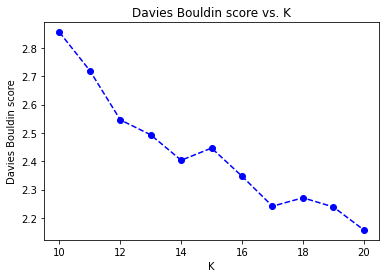

In [ ]:
plt.plot(centers, davies, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K')

Text(0.5, 1.0, 'Sum Squared Error vs. K')

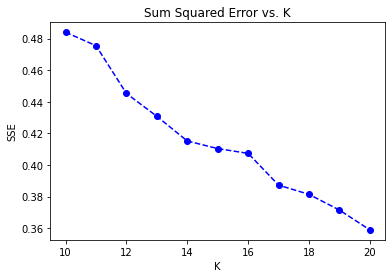

In [ ]:
plt.plot(centers, sse, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('SSE');
plt.title('Sum Squared Error vs. K')

Text(0.5, 1.0, 'Silhouette vs. K')

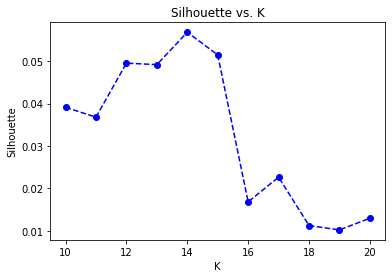

In [ ]:
plt.plot(centers, sil, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('Silhouette');
plt.title('Silhouette vs. K')

In [ ]:
n_clust = 14
km = KMeans(n_clusters = n_clust,n_init=10, max_iter=300, random_state=42)
km.fit(doc2vecs)
clusters = km.labels_.tolist()

In [ ]:
projects = { 'Titolo': np.array(df['titolo']), 'Cluster': clusters}
projects_df = pd.DataFrame(projects, index = [clusters] , columns = ['Titolo','Cluster'])
projects_df['Cluster'].value_counts()

3     16
11    15
8     15
9     12
7     11
2      8
1      8
5      5
4      5
12     3
0      3
13     2
10     2
6      2
Name: Cluster, dtype: int64

In [ ]:
def show_hist(k=0):
  k_vec = []
  for ind, project in projects_df.iterrows():
    titolo = project["Titolo"]
    cluster = project["Cluster"]
    if cluster == k:
      for index, item in df.iterrows():
        if item["titolo"] == titolo:
          amb = item["ambito"].split(",")
          for v in amb:
            k_vec.append(v)
  a = np.array(k_vec)
  plt.figure(figsize=(10,5))
  bins = np.arange(len(np.unique(a))+1) - 0.5
  plt.hist(a,edgecolor='black', linewidth=1.2,bins=bins) 
  plt.title("Histogram Cluster "+str(k)) 
  plt.xticks(rotation='vertical')
  plt.show()

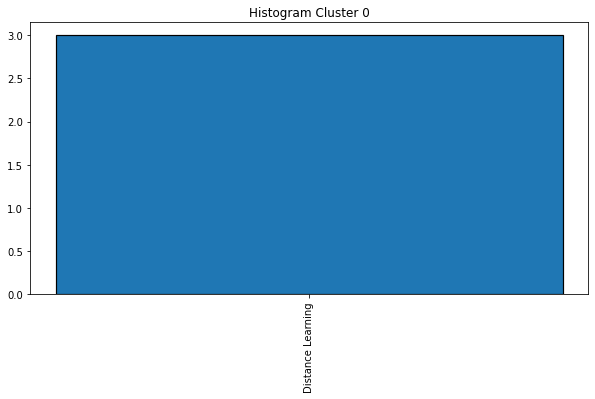

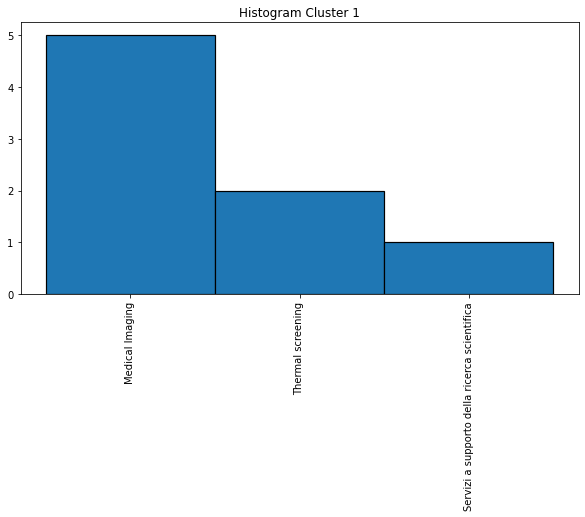

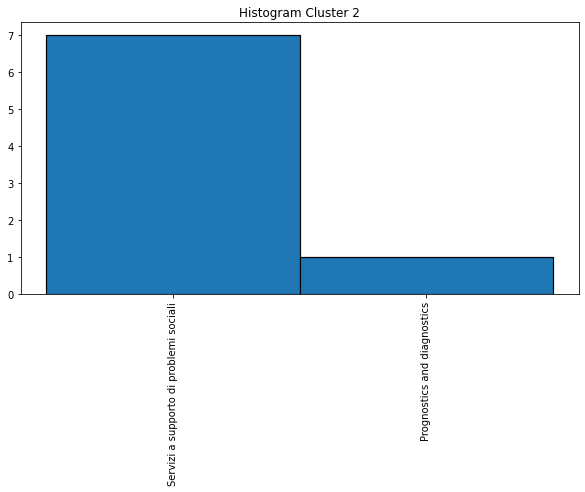

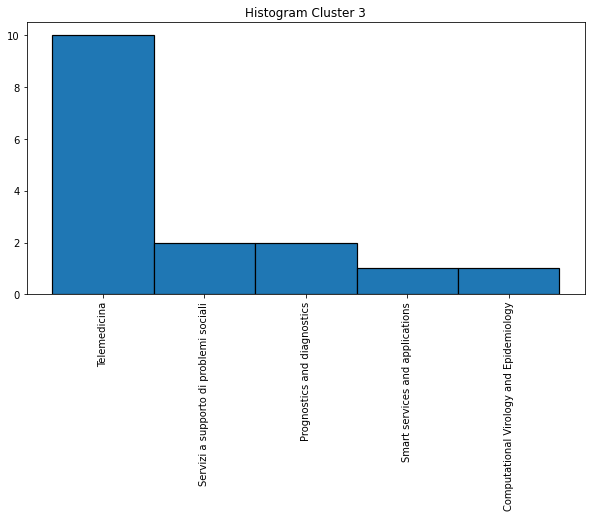

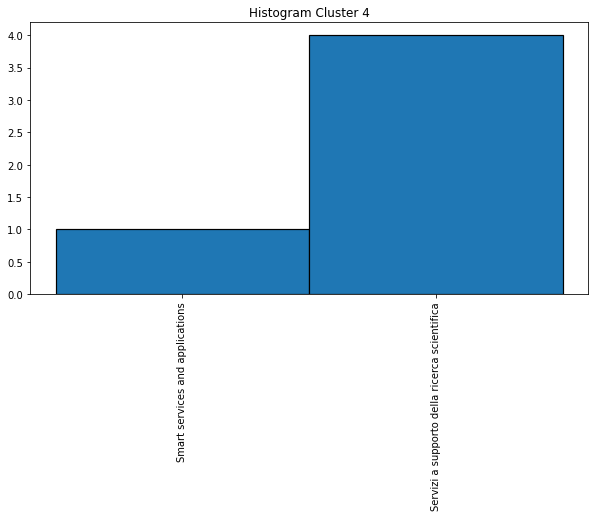

...

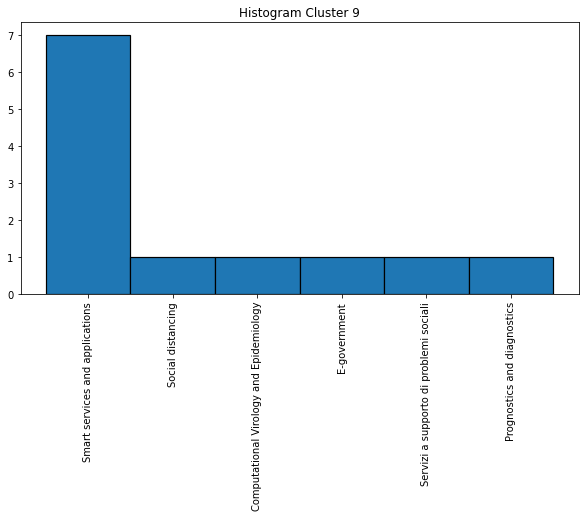

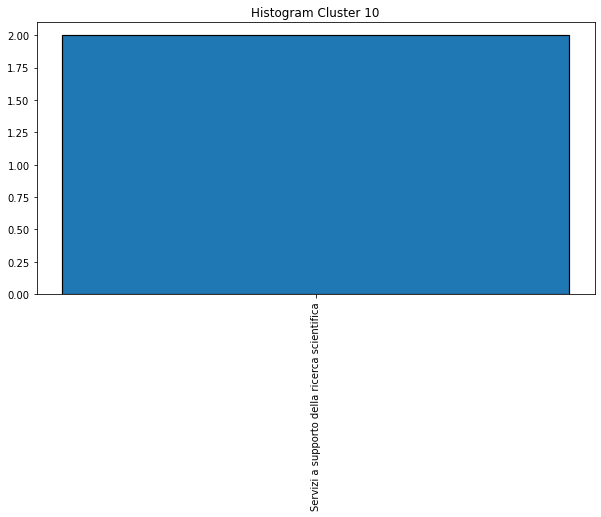

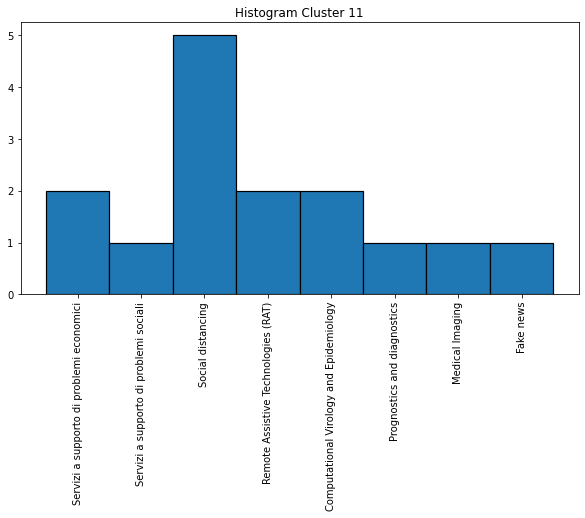

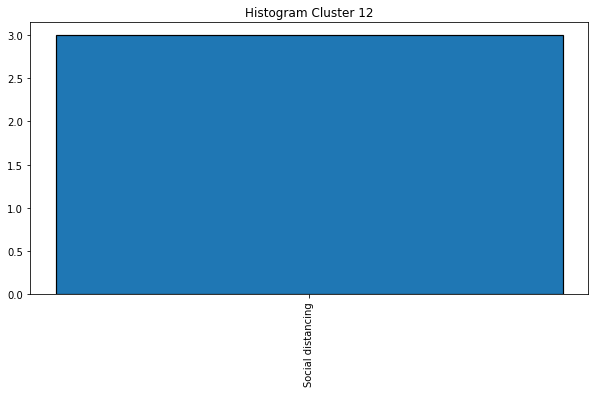

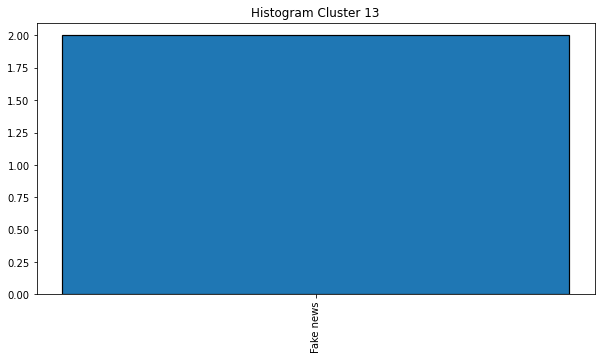

In [ ]:
for k in range(0,n_clust):
  show_hist(k)

In [ ]:
#change the value in return to set the single color need, in hsl format.
def grey_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(230,100%%, %d%%)" % np.random.randint(49,51))

def wordcloud_cluster_byIds(cluId):
    texts = []
    for i in range(0, len(clusters)):
        if clusters[i] == cluId:
            for word in obiettivi2kw[i]:
                texts.append(word)
            #for word in text2kw[i]:
            #    texts.append(word)
    
    wordcloud = WordCloud(max_font_size=60, relative_scaling=.8, width=900, height=400).generate(' '.join(texts))
    
    plt.figure(figsize=(30,20))
    plt.figtext(.5,.8,winners[cluId], fontsize=70, ha='center')
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig(str(cluId)+".png")

In [ ]:
winners = []
for k in range(0,n_clust):
  best = 0
  best_v = ''
  k_vec = []
  for ind, project in projects_df.iterrows():
    titolo = project["Titolo"]
    cluster = project["Cluster"]
    if cluster == k:
      for index, item in df.iterrows():
        if item["titolo"] == titolo:
          amb = item["ambito"].split(",")
          for v in amb:
            k_vec.append(v)
  (unique, counts)=np.unique(k_vec, return_counts=True)
  frequencies = np.asarray((unique, counts)).T
  for v in frequencies:
    if int(v[1]) > best:
      best = int(v[1])
      best_v = v[0]
  winners.append(best_v)

In [ ]:
winners

['Distance Learning',
 'Medical Imaging',
 'Servizi a supporto di problemi sociali',
 'Telemedicina',
 'Servizi a supporto della ricerca scientifica',
 'E-government',
 'Smart Working',
 'Prognostics and diagnostics',
 'Computational Virology and Epidemiology',
 'Smart services and applications',
 'Servizi a supporto della ricerca scientifica',
 'Social distancing',
 'Social distancing',
 'Fake news']

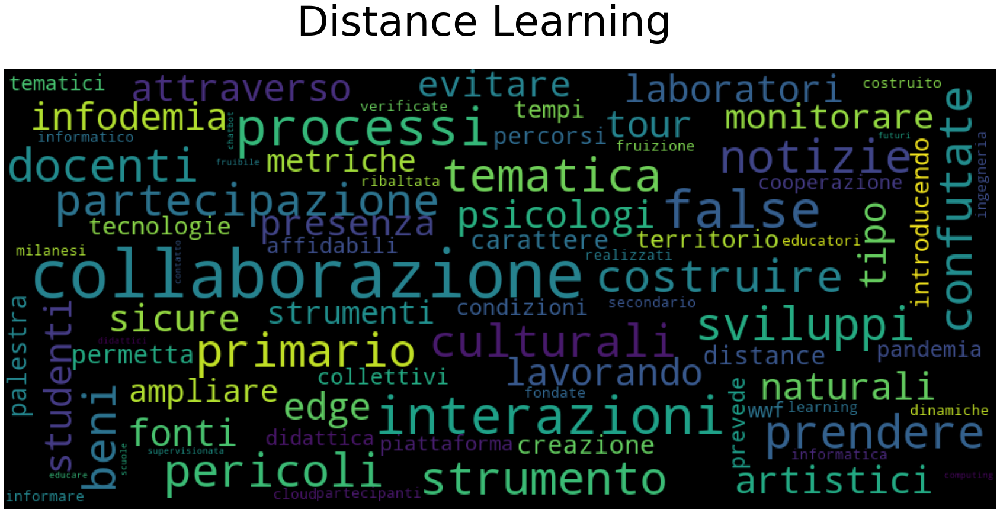

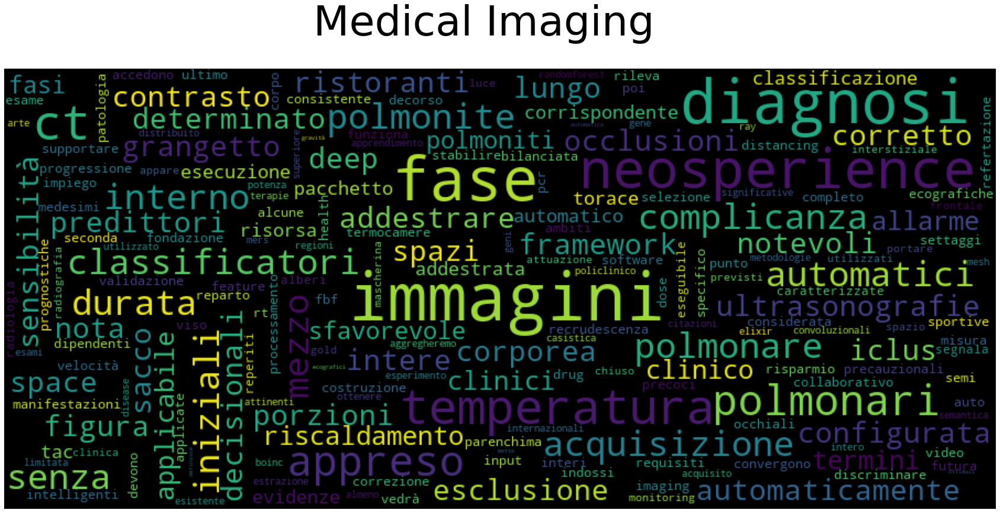

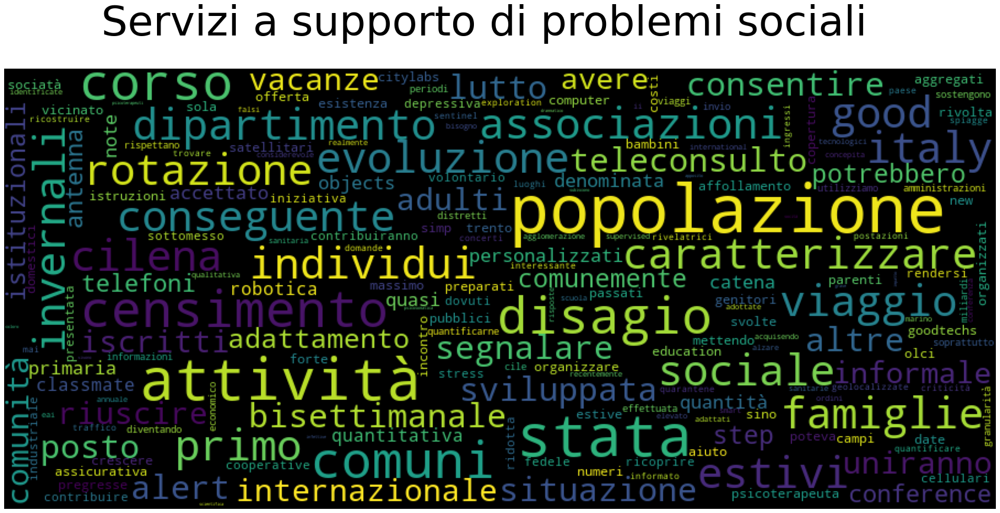

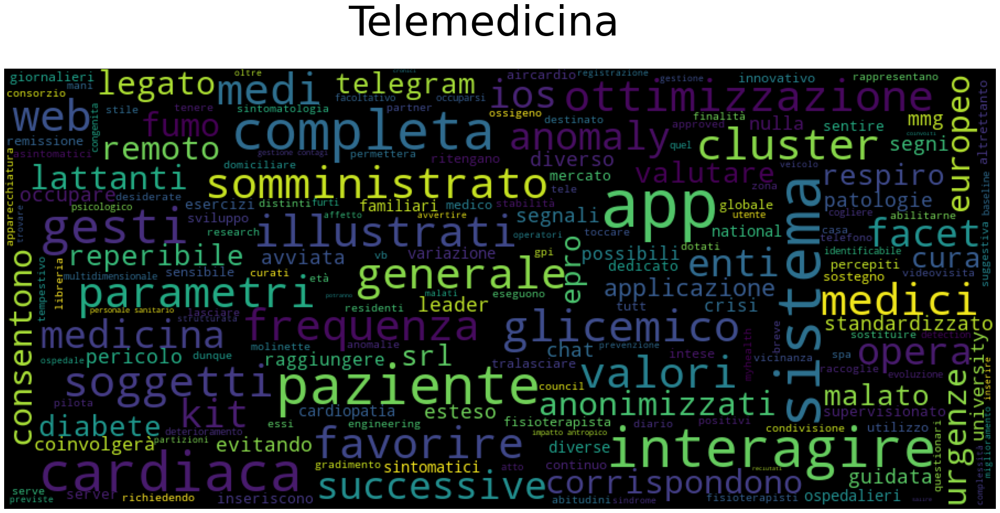

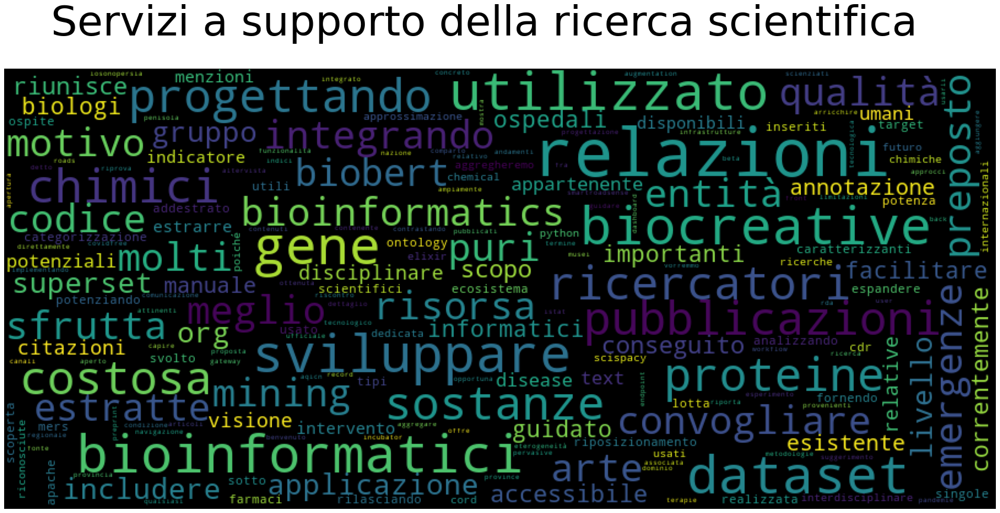

...

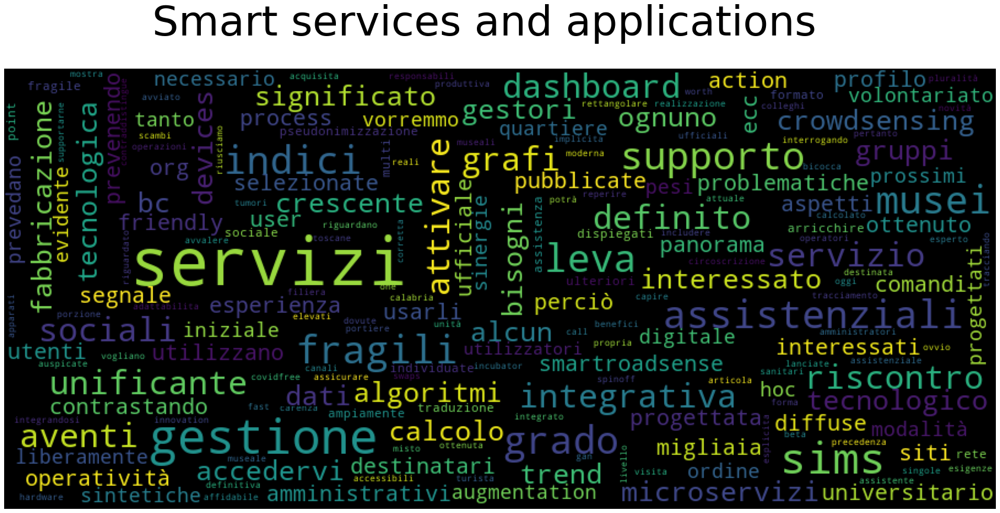

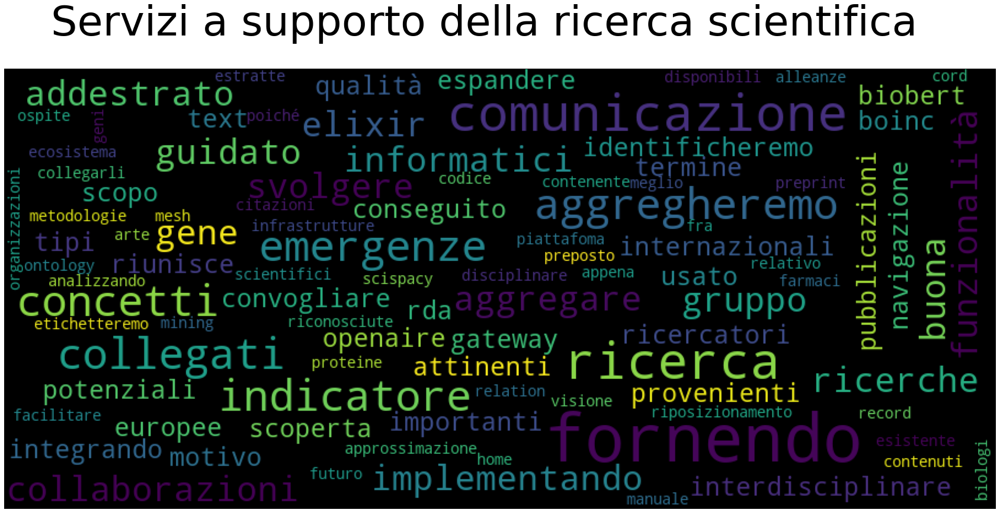

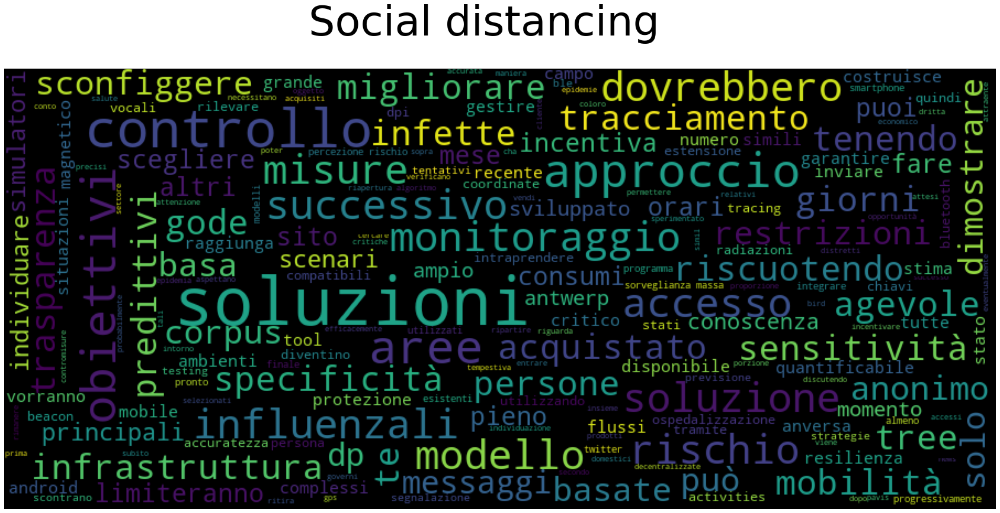

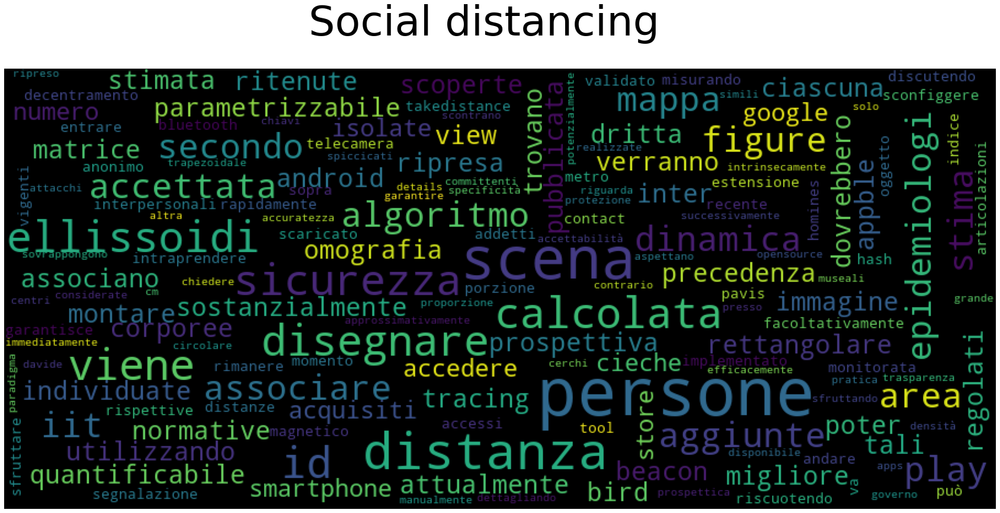

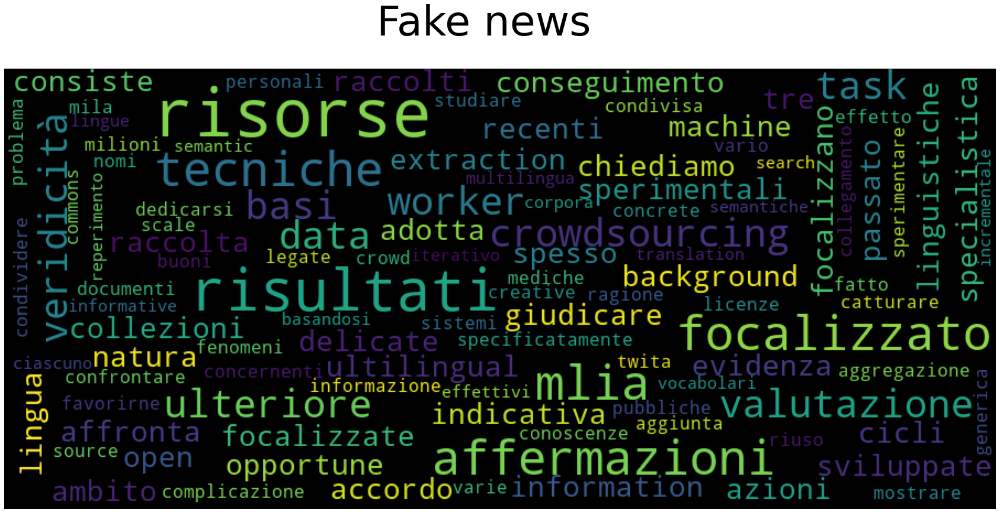

In [ ]:
for j in range(0,n_clust):
  wordcloud_cluster_byIds(j)

In [ ]:
for l in range(0,n_clust):
  dic = {}
  tot = 0
  for i in range(0, len(clusters)):
    if clusters[i] == l:
      for word in obiettivi2kw[i]:
        try:
          dic[word] = dic[word] +1
        except:
          dic[word] = 1
        tot = tot +1

  print("Cluster: "+str(winners[l]))
  dd = {}
  for w in dic.keys():
    val = (dic[w]/tot)
    dd[w]= val
  dd = dict(sorted(dd.items(), key=lambda item: item[1], reverse=True))
  j = 0
  for pp in dd.items():
    print(str(pp[0])+" "+str(pp[1]))
    if j >=25:
      break
    j = j+1
  print("--------------------------------")

Cluster: Distance Learning
collaborazione 0.02962962962962963
interazioni 0.022222222222222223
false 0.022222222222222223
processi 0.022222222222222223
primario 0.018518518518518517
prendere 0.018518518518518517
docenti 0.018518518518518517
strumento 0.018518518518518517
tematica 0.018518518518518517
notizie 0.018518518518518517
confutate 0.018518518518518517
pericoli 0.018518518518518517
sviluppi 0.018518518518518517
culturali 0.018518518518518517
costruire 0.018518518518518517
beni 0.018518518518518517
partecipazione 0.018518518518518517
laboratori 0.014814814814814815
tipo 0.014814814814814815
studenti 0.014814814814814815
edge 0.014814814814814815
attraverso 0.014814814814814815
fonti 0.014814814814814815
naturali 0.014814814814814815
psicologi 0.014814814814814815
tour 0.014814814814814815
--------------------------------
Cluster: Medical Imaging
immagini 0.0125
diagnosi 0.011111111111111112
fase 0.011111111111111112
neosperience 0.009722222222222222
ct 0.008333333333333333
temper

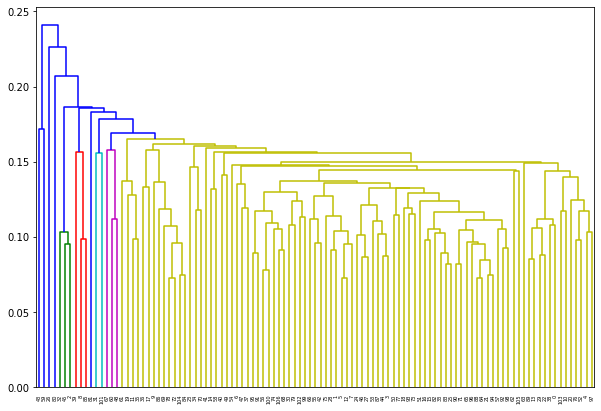

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

linked = linkage(doc2vecs, 'average', metric='cosine', optimal_ordering=True)

labelList = range(0, len(doc2vecs))

plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            labels=labelList,
            distance_sort='descending',
            show_leaf_counts=True)
plt.show()

In [ ]:
import joblib
joblib.dump(km,"covid_19_kmeans_BERT_model_final.joblib")
joblib.dump(doc2vecs,"covid_19_BERT_doc2vecs.joblib")

['covid_19_BERT_doc2vecs.joblib']

In [ ]:
joblib.dump(projects_df,"covid_19_projects_df_BERT.joblib")

['covid_19_projects_df_BERT.joblib']

In [ ]:
f = open("covid_19_BERT_clusters.csv","w")
f.write("cluster"+"\t"+"titolo_progetto"+"\t"+"final_cluster"+"\t"+"initial_cluster"+"\n")
for index,ele in projects_df.iterrows():
  f.write(str(ele["Cluster"])+"\t"+ele["Titolo"]+"\t"+winners[ele["Cluster"]]+"\t"+df.loc[df['titolo'] == ele["Titolo"]]["ambito"].values[0]+"\n")
f.close()